### Install Libraries

In [12]:
!pip install autoviz
!pip install pandas-profiling
!pip install sweetviz
!pip install lazypredict

### Import

In [13]:
import math
import lazypredict
import pandas as pd
import seaborn as sns
import sweetviz as sv
from autoviz import FixDQ
from tabulate import tabulate
import matplotlib.pyplot as plt
from autoviz import AutoViz_Class
from ydata_profiling import ProfileReport
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from autoviz import data_cleaning_suggestions
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from lazypredict.Supervised import LazyClassifier
%matplotlib inline

# Understanding Data

### Read the csv file

In [8]:
# Read the csv file
df=pd.read_csv("/content/drive/MyDrive/forseAI/insurance_data_sample.csv")

In [9]:
# List of explanations for each column
col_explanations = [
    "Unique identifier for each car.",
    "Date of the transaction.",
    "Name of the customer.",
    "Gender of the customer.",
    "Annual income of the customer.",
    "Name of the car dealer.",
    "Brand of the car.",
    "Model of the car.",
    "Type of engine in the car.",
    "Type of transmission in the car.",
    "Color of the car.",
    "Price of the car in dollars.",
    "Dealer number.",
    "Body style of the car.",
    "Phone number of the customer.",
    "Amount paid for car insurance.",
    "Amount claimed in insurance.",
    "City where the transaction took place."
]

# Creating a DataFrame from the column explanations
col_explanation_df = pd.DataFrame({
    'Variables': ['Car_id', 'Date', 'Customer_Name', 'Gender', 'Annual_Income', 'Dealer_Name',
                  'Company', 'Model', 'Engine', 'Transmission', 'Color', 'Price_($)',
                  'Dealer_No', 'Body_Style', 'Phone', 'Amount_paid_for_insurance',
                  'Claim_amount', 'City'],
    'Explanation': col_explanations
})

# Applying a background gradient to the DataFrame for better visualization
col_explanation_df.style.background_gradient()


,Variables,Explanation
0,Car_id,Unique identifier for each car.
1,Date,Date of the transaction.
2,Customer_Name,Name of the customer.
3,Gender,Gender of the customer.
4,Annual_Income,Annual income of the customer.
5,Dealer_Name,Name of the car dealer.
6,Company,Brand of the car.
7,Model,Model of the car.
8,Engine,Type of engine in the car.
9,Transmission,Type of transmission in the car.


In [10]:
import sns
sns.pairplot(df, hue="Claim_amount", palette="viridis");

ModuleNotFoundError: No module named 'sns'

In [3]:
# Clean up column names
df.columns = df.columns.str.strip().str.replace(' ', '_')
print(df.columns)

NameError: name 'df' is not defined

### Statistical Analysis

In [ ]:
def print_tabulated_data(data_frame):
    """
    Print tabulated data from a DataFrame.
    """
    print(tabulate(data_frame, headers='keys', tablefmt='psql'))


def explore_dataframe(df):
    """
    Perform basic exploratory data analysis on the input DataFrame.
    """
    # Print DataFrame shape
    print("-----------------------------------Shape Of Data-------------------------------------")
    df_shape = df.shape
    print(df_shape)
    print("\n")

    # Print top 5 records
    print("-----------------------------------Top 5 Records-------------------------------------")
    print_tabulated_data(df.head(5))
    print("\n")

    # Print DataFrame information
    print("-----------------------------------Info----------------------------------------------")
    df_info = df.info()
    print_tabulated_data(df_info)
    print("\n")

    # Print DataFrame description
    print("-----------------------------------Describe-------------------------------------------")
    df_describe = df.describe()
    print_tabulated_data(df_describe)
    print("\n")

    # Print column names
    print("-----------------------------------Columns-------------------------------------------")
    df_columns = df.columns
    print(df_columns)
    print("\n")

    # Print data types
    print("-----------------------------------Data Types-----------------------------------------")
    df_dtypes = df.dtypes
    print(df_dtypes)
    print("\n")

    # Print missing values
    print("-----------------------------------Missing Values-------------------------------------")
    df_missing_values = df.isnull().sum()
    print(df_missing_values)
    print("\n")

    # Print NULL values§
    print("-----------------------------------Null values----------------------------------------")
    df_null_values = df.isna().sum()
    print(df_null_values)
    print("\n")

    # Print Dublicate Row if exists
    print("-----------------------------------Dublicate Rows----------------------------------------")
    duplicate_rows = df[df.duplicated()]
    print(duplicate_rows)
    print("\n")

In [ ]:
# Define a list of dataframes and their corresponding labels
datasets = [(df, "Dataset Exploration")]

# Loop through each dataframe and label pair
for df, label in datasets:
    print("================================={}=================================".format(label))
    explore_dataframe(df)

=================================Dataset Exploration=================================
-----------------------------------Shape Of Data-------------------------------------
(23906, 18)


-----------------------------------Top 5 Records-------------------------------------
+----+--------------+------------+-----------------+----------+-----------------+-------------------------------------+-----------+------------+-----------------------------+----------------+------------+-------------+-------------+--------------+---------+-----------------------------+----------------+---------+
|    | Car_id       | Date       | Customer_Name   | Gender   |   Annual_Income | Dealer_Name                         | Company   | Model      | Engine                      | Transmission   | Color      |   Price_($) | Dealer_No   | Body_Style   |   Phone |   Amount_paid_for_insurance |   Claim_amount | City    |
|----+--------------+------------+-----------------+----------+-----------------+-----------------

#### converting date from object to datetime.

In [ ]:
# Extract year, month, and day from the Date column
df['Date'] = pd.to_datetime(df['Date'])
df.info()
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.strftime('%b')
df['Day'] = df['Date'].dt.day

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23906 entries, 0 to 23905
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Car_id                     23906 non-null  object        
 1   Date                       23906 non-null  datetime64[ns]
 2   Customer_Name              23905 non-null  object        
 3   Gender                     23906 non-null  object        
 4   Annual_Income              23906 non-null  int64         
 5   Dealer_Name                23906 non-null  object        
 6   Company                    23906 non-null  object        
 7   Model                      23906 non-null  object        
 8   Engine                     23906 non-null  object        
 9   Transmission               23906 non-null  object        
 10  Color                      23906 non-null  object        
 11  Price_($)                  23906 non-null  int64         
 12  Deal

In [ ]:
df.head()

,Car_id,Date,Customer_Name,Gender,Annual_Income,Dealer_Name,Company,Model,Engine,Transmission,Color,Price_($),Dealer_No,Body_Style,Phone,Amount_paid_for_insurance,Claim_amount,City,Year,Month,Day
0,C_CND_000001,2022-01-02,Geraldine,Male,13500,Buddy Storbeck's Diesel Service Inc,Ford,Expedition,DoubleÃ‚Â Overhead Camshaft,Auto,Black,26000,06457-3834,SUV,8264678,1665,0.00,Riga,2022,Jan,2
1,C_CND_000002,2022-01-02,Gia,Male,1480000,C & M Motors Inc,Dodge,Durango,DoubleÃ‚Â Overhead Camshaft,Auto,Black,19000,60504-7114,SUV,6848189,1332,1900.00,Liepaja,2022,Jan,2
2,C_CND_000003,2022-01-02,Gianna,Male,1035000,Capitol KIA,Cadillac,Eldorado,Overhead Camshaft,Manual,Red,31500,38701-8047,Passenger,7298798,1897,0.00,Riga,2022,Jan,2
3,C_CND_000004,2022-01-02,Giselle,Male,13500,Chrysler of Tri-Cities,Toyota,Celica,Overhead Camshaft,Manual,Pale White,14000,99301-3882,SUV,6257557,1176,0.00,Jelgava,2022,Jan,2
4,C_CND_000005,2022-01-02,Grace,Male,1465000,Chrysler Plymouth,Acura,TL,DoubleÃ‚Â Overhead Camshaft,Auto,Red,24500,53546-9427,Hatchback,7081483,1323,2450.00,Liepaja,2022,Jan,2


#### Imputing the customer Name

In [ ]:
# Impute missing values in the 'Customer Name' column with the string 'Missing'
df['Customer_Name'] = df['Customer_Name'].fillna('Missing')

In [ ]:
# Define a list of dataframes and their corresponding labels
datasets = [(df, "Dataset Exploration")]

# Loop through each dataframe and label pair
for df, label in datasets:
    print("================================={}=================================".format(label))
    explore_dataframe(df)

=================================Dataset Exploration=================================
-----------------------------------Shape Of Data-------------------------------------
(23906, 21)


-----------------------------------Top 5 Records-------------------------------------
+----+--------------+---------------------+-----------------+----------+-----------------+-------------------------------------+-----------+------------+-----------------------------+----------------+------------+-------------+-------------+--------------+---------+-----------------------------+----------------+---------+--------+---------+-------+
|    | Car_id       | Date                | Customer_Name   | Gender   |   Annual_Income | Dealer_Name                         | Company   | Model      | Engine                      | Transmission   | Color      |   Price_($) | Dealer_No   | Body_Style   |   Phone |   Amount_paid_for_insurance |   Claim_amount | City    |   Year | Month   |   Day |
|----+--------------+-----

# Exploratory Data Analysis

### Using Pandas Profiling

In [ ]:
design_report = ProfileReport(df)
design_report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Drop one of each pair of highly correlated columns
columns_to_drop = ['Car_id','Amount_paid_for_insurance', 'Dealer_No', 'Transmission','Customer_Name','Phone']
df.drop(columns=columns_to_drop, axis=1, inplace=True)

### Using AutoViz

Shape of your Data Set loaded: (23906, 15)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  1
    Number of Integer-Categorical Columns =  3
    Number of String-Categorical Columns =  6
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  2
    Number of Numeric-Boolean Columns =  1
    Number of Discrete String Columns =  1
    Number of NLP String Columns =  0
    Number of Date Time Columns =  1
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    15 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
To fix these data quality issues in the dataset, import FixDQ from autoviz...
    All variab

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Date,datetime64[ns],0.000000,2,,,Possible date-time colum: transform before modeling step.
Gender,object,0.000000,0,,,No issue
Annual_Income,int64,0.000000,10,10080.000000,11200000.000000,Column has 816 outliers greater than upper bound (2360375.00) or lower than lower bound(-798625.00). Cap them or remove them.
Dealer_Name,object,0.000000,0,,,No issue
Company,object,0.000000,0,,,"3 rare categories: ['Saab', 'Infiniti', 'Jaguar']. Group them into a single category or drop the categories."
Model,object,0.000000,0,,,Possible high cardinality column with 154 unique values: Use hash encoding or text embedding to reduce dimension.
Engine,object,0.000000,0,,,No issue
Color,object,0.000000,0,,,No issue
Price_($),int64,0.000000,3,1200.000000,85800.000000,Column has 1449 outliers greater than upper bound (57998.50) or lower than lower bound(-5997.50). Cap them or remove them.
Body_Style,object,0.000000,0,,,No issue


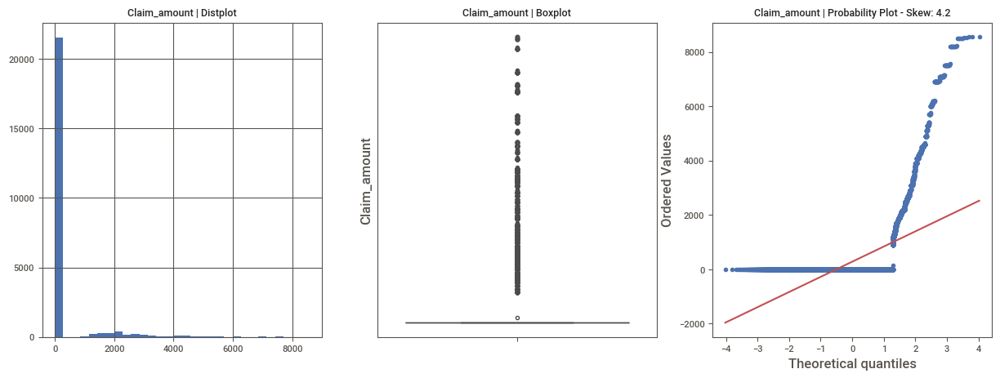

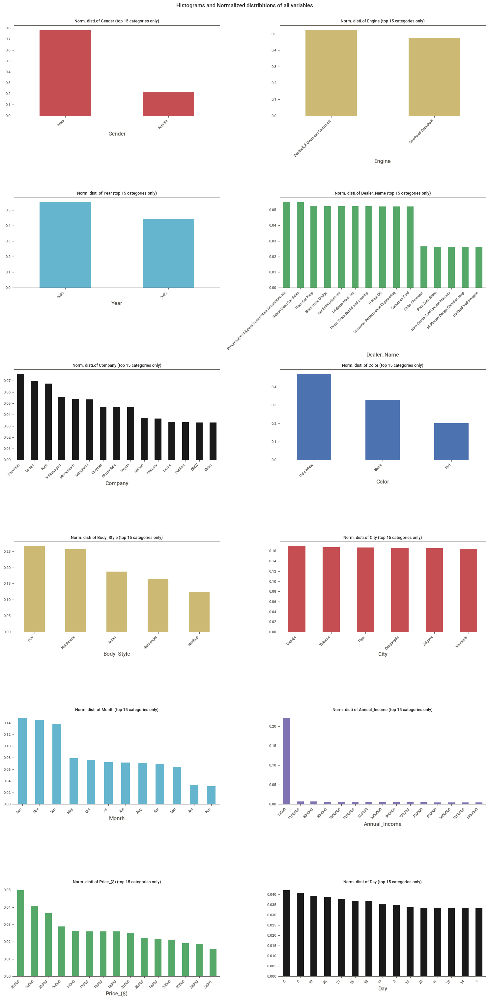

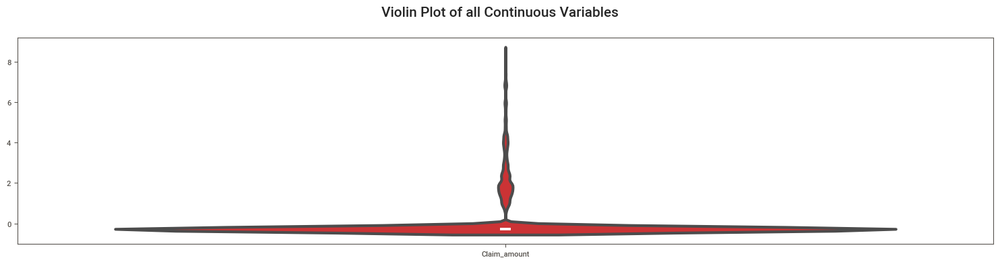

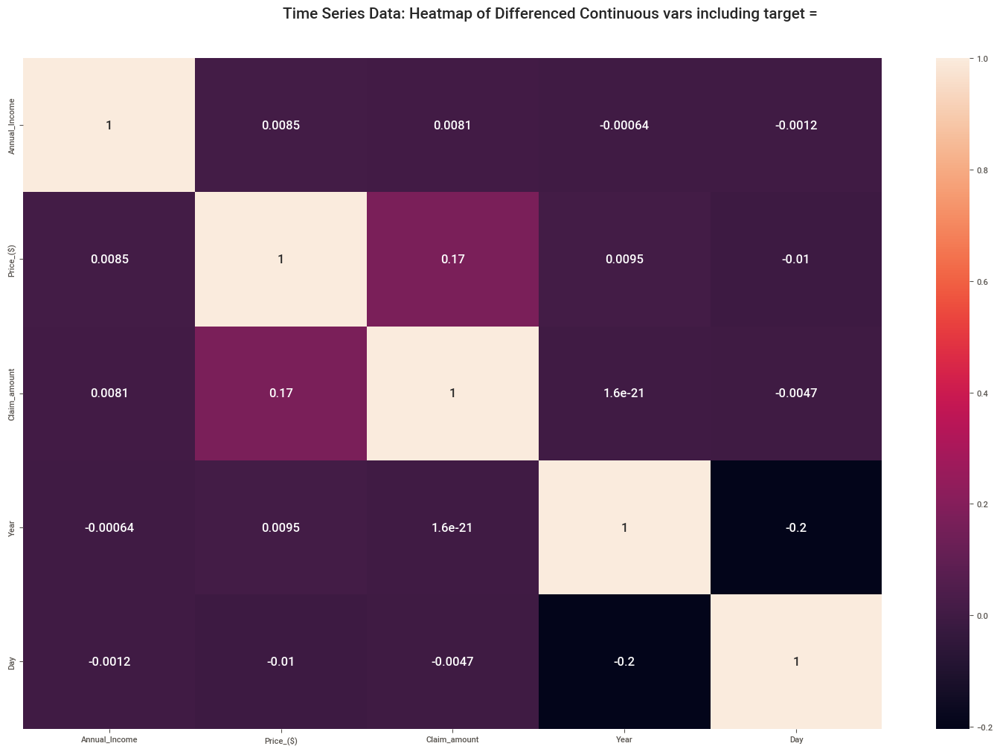

<Figure size 1500x0 with 0 Axes>

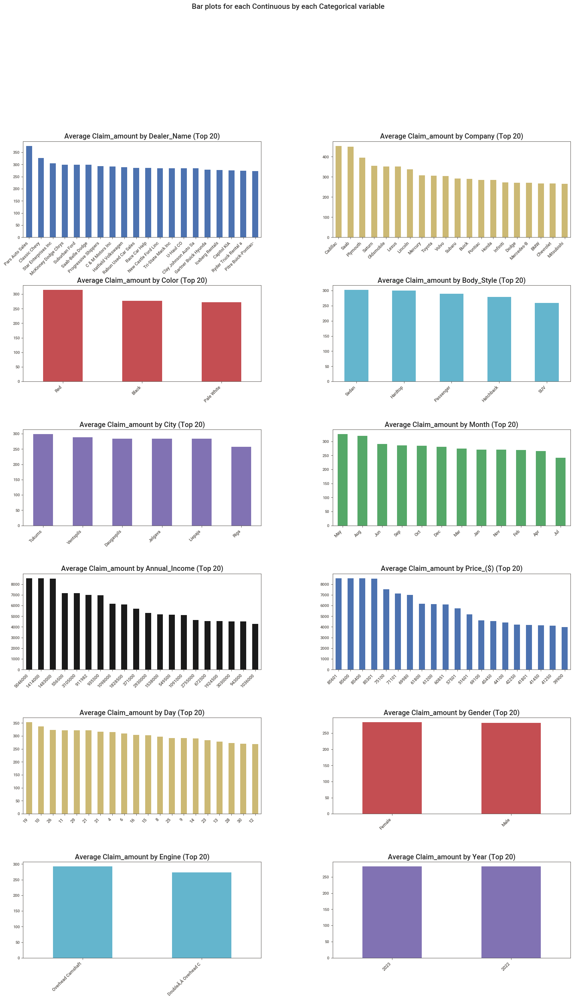

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package movie_reviews is already up-to-date!
[nltk_data]    | Downloading package names to /root/nltk_data...
[nltk_data]    |   Package names is already up-to-date!
[nltk_data]    | Do

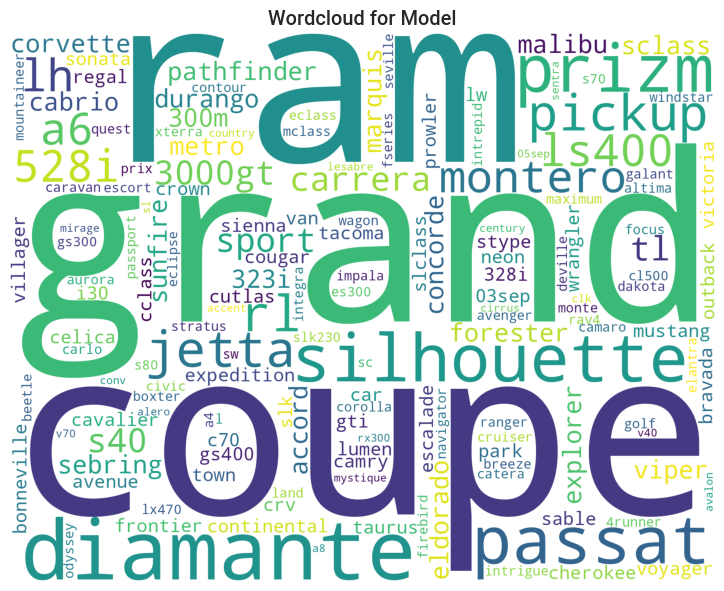

All Plots done
Time to run AutoViz = 24 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [ ]:
AV = AutoViz_Class()
dft = AV.AutoViz(
    "",
    sep=",",
    depVar="",
    dfte=df,
    header=0,
    verbose=1,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=350000,
    max_cols_analyzed=30,
    save_plot_dir=None
)

In [ ]:
fixdq = FixDQ()
fixdq.detect_duplicates(df)
data_cleaning_suggestions(df)

    All variables classified into correct types.


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Date,datetime64[ns],0.000000,2,,,Possible date-time colum: transform before modeling step.
Gender,object,0.000000,0,,,No issue
Annual_Income,int64,0.000000,10,10080.000000,11200000.000000,Column has 816 outliers greater than upper bound (2360375.00) or lower than lower bound(-798625.00). Cap them or remove them.
Dealer_Name,object,0.000000,0,,,No issue
Company,object,0.000000,0,,,"3 rare categories: ['Saab', 'Infiniti', 'Jaguar']. Group them into a single category or drop the categories."
Model,object,0.000000,0,,,Possible high cardinality column with 154 unique values: Use hash encoding or text embedding to reduce dimension.
Engine,object,0.000000,0,,,No issue
Color,object,0.000000,0,,,No issue
Price_($),int64,0.000000,3,1200.000000,85800.000000,Column has 1449 outliers greater than upper bound (57998.50) or lower than lower bound(-5997.50). Cap them or remove them.
Body_Style,object,0.000000,0,,,No issue


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Date,datetime64[ns],0.00,2,,,Possible date-time colum: transform before modeling step.
Gender,object,0.00,0,,,No issue
Annual_Income,int64,0.00,10,10080.00,11200000.00,Column has 816 outliers greater than upper bound (2360375.00) or lower than lower bound(-798625.00). Cap them or remove them.
Dealer_Name,object,0.00,0,,,No issue
Company,object,0.00,0,,,"3 rare categories: ['Saab', 'Infiniti', 'Jaguar']. Group them into a single category or drop the categories."
Model,object,0.00,0,,,Possible high cardinality column with 154 unique values: Use hash encoding or text embedding to reduce dimension.
Engine,object,0.00,0,,,No issue
Color,object,0.00,0,,,No issue
Price_($),int64,0.00,3,1200.00,85800.00,Column has 1449 outliers greater than upper bound (57998.50) or lower than lower bound(-5997.50). Cap them or remove them.
Body_Style,object,0.00,0,,,No issue


### Observations from the above EDA

In [ ]:
df['Company'].value_counts ()

Company
Chevrolet     1819
Dodge         1671
Ford          1614
Volkswagen    1333
Mercedes-B    1285
Mitsubishi    1277
Chrysler      1120
Oldsmobile    1111
Toyota        1110
Nissan         886
Mercury        874
Lexus          802
Pontiac        796
BMW            790
Volvo          789
Honda          708
Acura          689
Cadillac       652
Plymouth       617
Saturn         586
Lincoln        492
Audi           468
Buick          439
Subaru         405
Jeep           363
Porsche        361
Hyundai        264
Saab           210
Infiniti       195
Jaguar         180
Name: count, dtype: int64

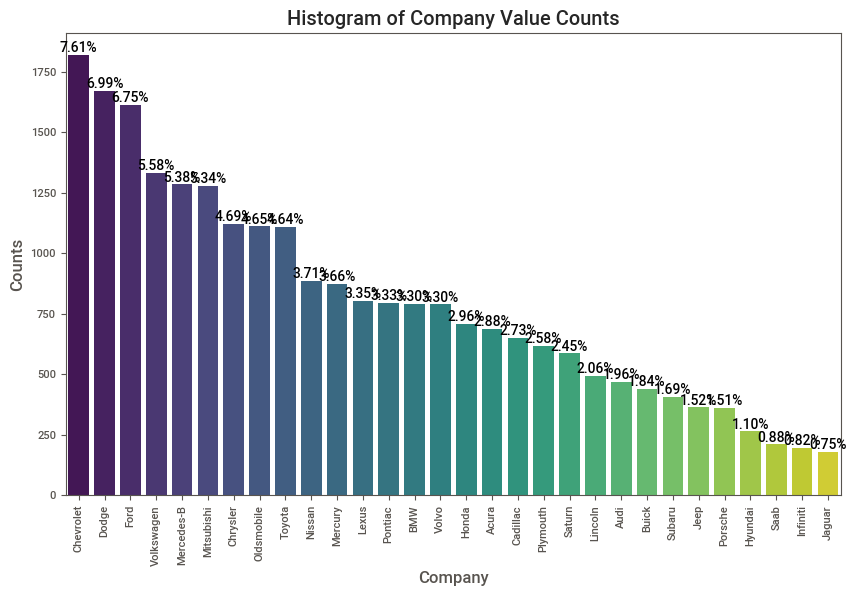

In [ ]:
def plot_value_counts(df, column, xlabel_rotation=90, figsize=(10, 6), palette='viridis'):
    """
    Plot a histogram showing the value counts of a column in the DataFrame
    and print the percentage of each value within the plot.
    """
    # Get the value counts for the specified column
    column_counts = df[column].value_counts()
    total_count = len(df)

    # Calculate percentages
    percentages = (column_counts / total_count) * 100

    # Create a DataFrame for plotting
    plot_data = pd.DataFrame({
        column: column_counts.index,
        'Counts': column_counts.values,
        'Percentage': percentages
    })

    # Plot the histogram
    plt.figure(figsize=figsize)
    ax = sns.barplot(x=column_counts.index, y=column_counts.values, palette=palette)
    plt.xticks(rotation=xlabel_rotation)
    plt.xlabel(column)
    plt.ylabel('Counts')
    plt.title(f'Histogram of {column} Value Counts')

    # Add percentage annotations
    for p in ax.patches:
        percentage = 100 * p.get_height() / total_count
        ax.annotate(f'{percentage:.2f}%', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                    textcoords='offset points')

    plt.show()

plot_value_counts(df, 'Company')

In [ ]:
# Define a list of dataframes and their corresponding labels
datasets = [(df, "Dataset Exploration")]

# Loop through each dataframe and label pair
for df, label in datasets:
    print("================================={}=================================".format(label))
    explore_dataframe(df)

=================================Dataset Exploration=================================
-----------------------------------Shape Of Data-------------------------------------
(23906, 15)


-----------------------------------Top 5 Records-------------------------------------
+----+---------------------+----------+-----------------+-------------------------------------+-----------+------------+-----------------------------+------------+-------------+--------------+----------------+---------+--------+---------+-------+
|    | Date                | Gender   |   Annual_Income | Dealer_Name                         | Company   | Model      | Engine                      | Color      |   Price_($) | Body_Style   |   Claim_amount | City    |   Year | Month   |   Day |
|----+---------------------+----------+-----------------+-------------------------------------+-----------+------------+-----------------------------+------------+-------------+--------------+----------------+---------+--------+------

## Fixing Data Quality Issues

In [ ]:
fixdq = FixDQ()
fixdq.detect_duplicates(df)
data_cleaning_suggestions(df)

    All variables classified into correct types.


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Date,datetime64[ns],0.000000,2,,,Possible date-time colum: transform before modeling step.
Gender,object,0.000000,0,,,No issue
Annual_Income,int64,0.000000,10,10080.000000,11200000.000000,Column has 816 outliers greater than upper bound (2360375.00) or lower than lower bound(-798625.00). Cap them or remove them.
Dealer_Name,object,0.000000,0,,,No issue
Company,object,0.000000,0,,,"3 rare categories: ['Saab', 'Infiniti', 'Jaguar']. Group them into a single category or drop the categories."
Model,object,0.000000,0,,,Possible high cardinality column with 154 unique values: Use hash encoding or text embedding to reduce dimension.
Engine,object,0.000000,0,,,No issue
Color,object,0.000000,0,,,No issue
Price_($),int64,0.000000,3,1200.000000,85800.000000,Column has 1449 outliers greater than upper bound (57998.50) or lower than lower bound(-5997.50). Cap them or remove them.
Body_Style,object,0.000000,0,,,No issue


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Date,datetime64[ns],0.00,2,,,Possible date-time colum: transform before modeling step.
Gender,object,0.00,0,,,No issue
Annual_Income,int64,0.00,10,10080.00,11200000.00,Column has 816 outliers greater than upper bound (2360375.00) or lower than lower bound(-798625.00). Cap them or remove them.
Dealer_Name,object,0.00,0,,,No issue
Company,object,0.00,0,,,"3 rare categories: ['Saab', 'Infiniti', 'Jaguar']. Group them into a single category or drop the categories."
Model,object,0.00,0,,,Possible high cardinality column with 154 unique values: Use hash encoding or text embedding to reduce dimension.
Engine,object,0.00,0,,,No issue
Color,object,0.00,0,,,No issue
Price_($),int64,0.00,3,1200.00,85800.00,Column has 1449 outliers greater than upper bound (57998.50) or lower than lower bound(-5997.50). Cap them or remove them.
Body_Style,object,0.00,0,,,No issue


## SweetViz

In [ ]:
sweet_report = sv.analyze(df)
sweet_report.show_html('sweetviz_report.html')

                                             |          | [  0%]   00:00 -> (? left)

Report sweetviz_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



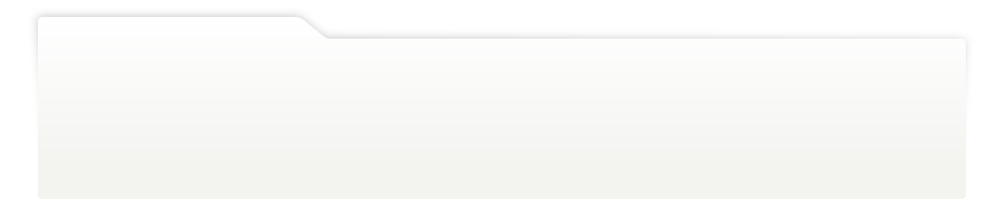
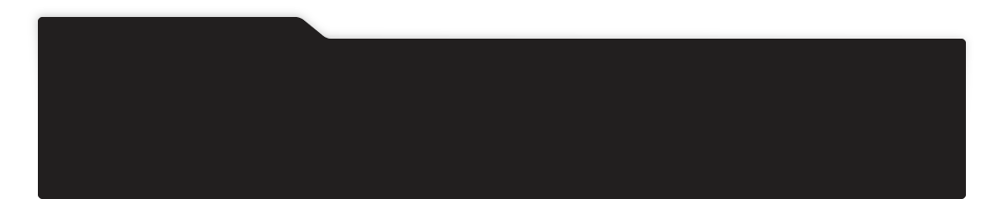
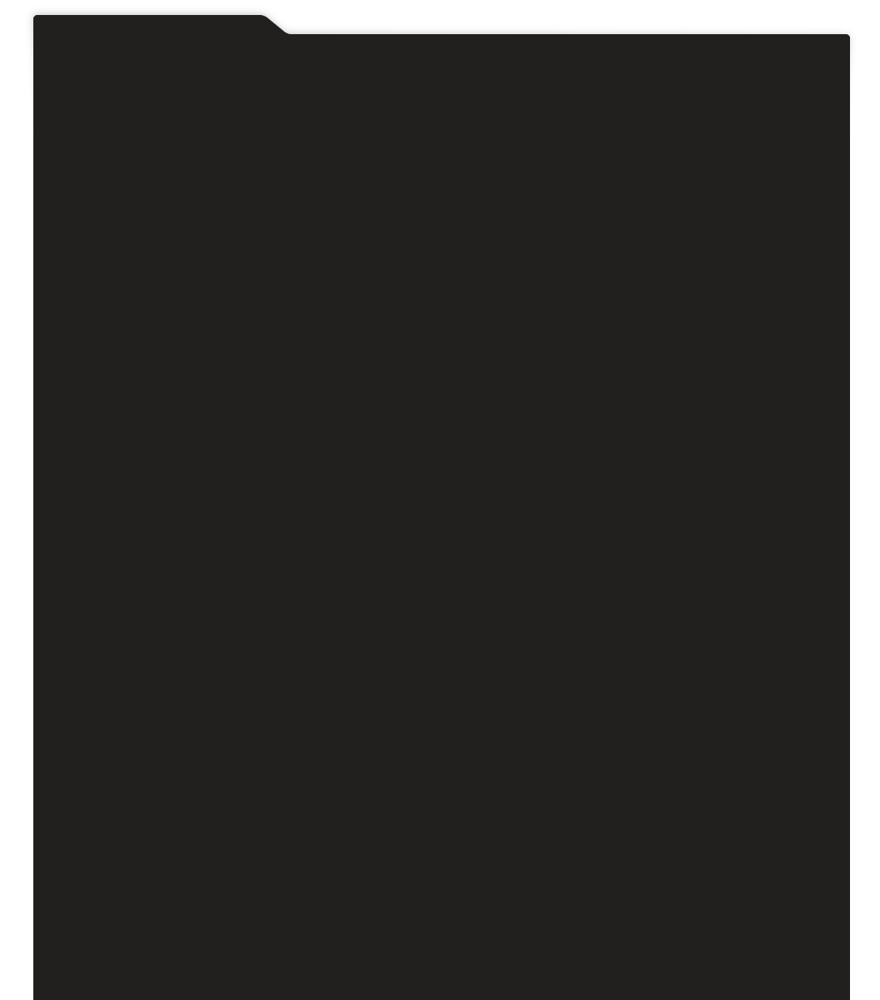
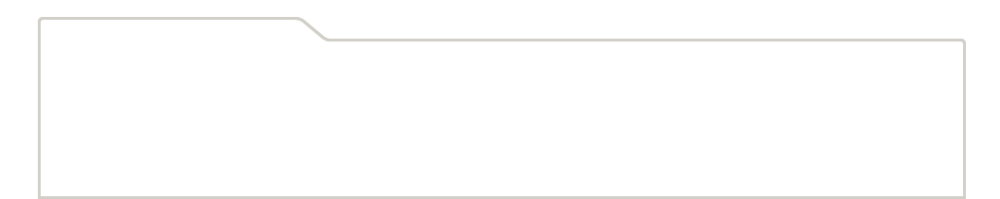
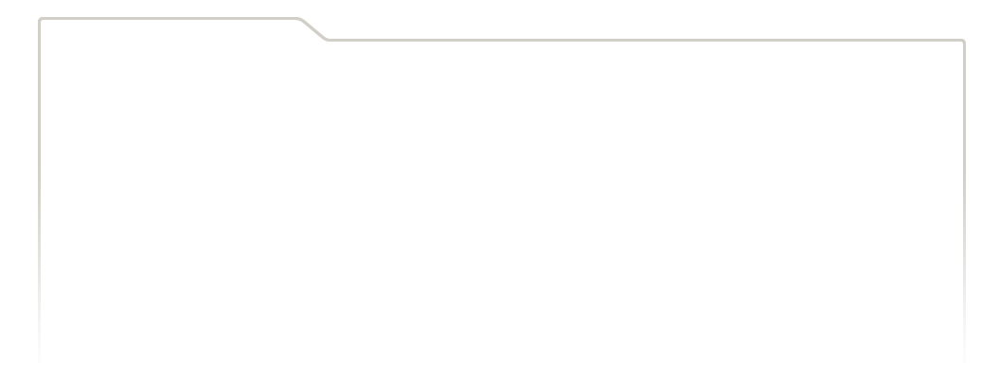
...
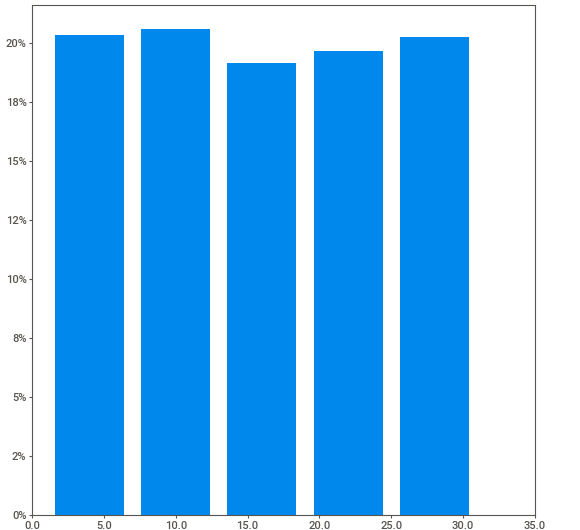
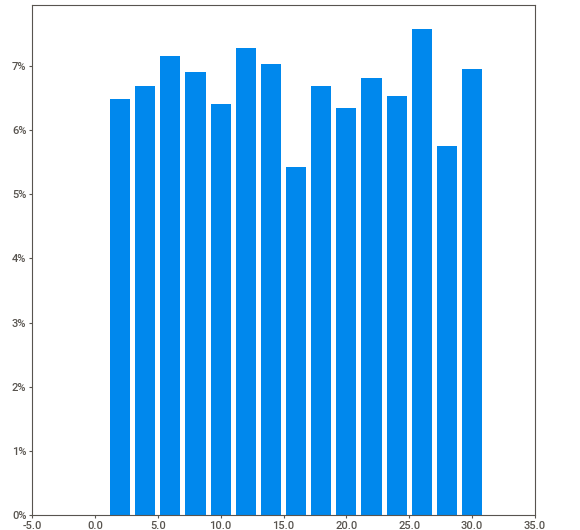
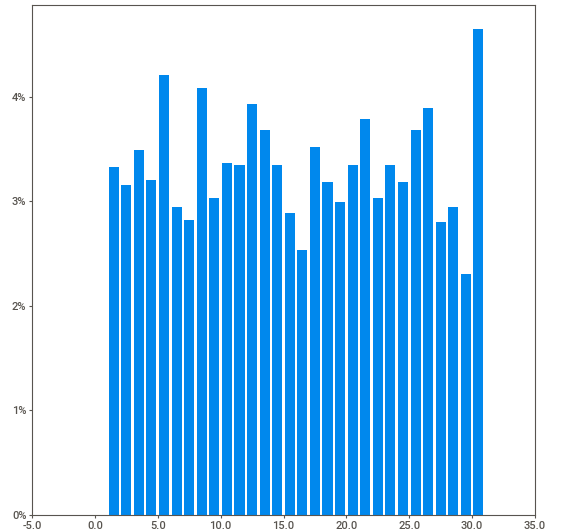
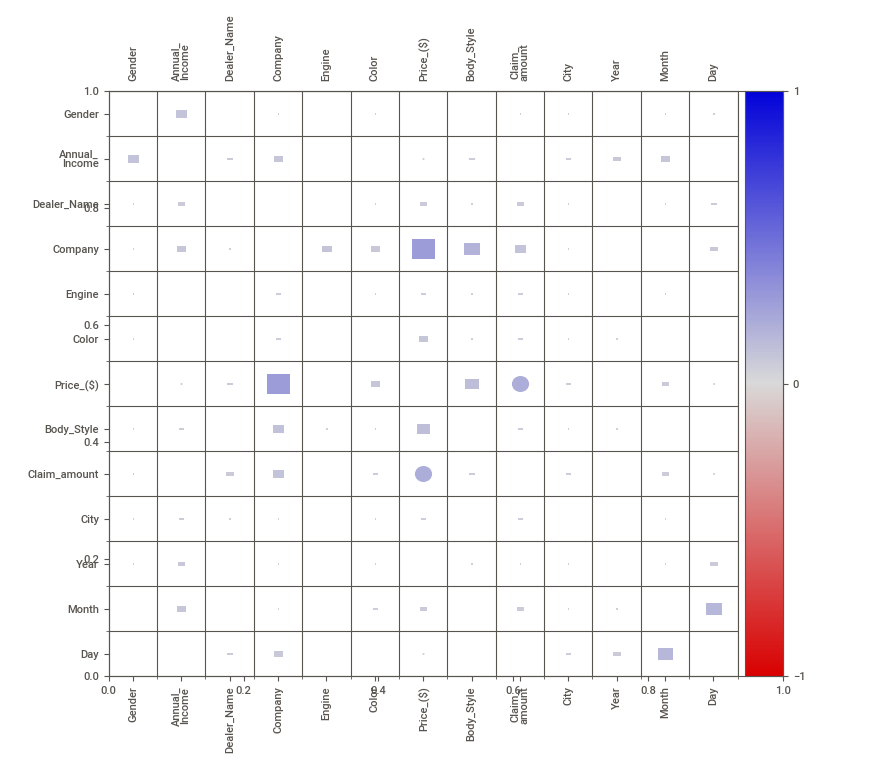
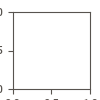

Report '/content/sweetviz_report.html' was saved to storage.


In [ ]:
sweet_report.show_notebook(w=None, h=None,
scale=None,
layout='vertical',
filepath='/content/sweetviz_report.html')

In [ ]:
df.head(5)

,Date,Gender,Annual_Income,Dealer_Name,Company,Model,Engine,Color,Price_($),Body_Style,Claim_amount,City,Year,Month,Day
0,2022-01-02,Male,13500,Buddy Storbeck's Diesel Service Inc,Ford,Expedition,DoubleÃ‚Â Overhead Camshaft,Black,26000,SUV,0.00,Riga,2022,Jan,2
1,2022-01-02,Male,1480000,C & M Motors Inc,Dodge,Durango,DoubleÃ‚Â Overhead Camshaft,Black,19000,SUV,1900.00,Liepaja,2022,Jan,2
2,2022-01-02,Male,1035000,Capitol KIA,Cadillac,Eldorado,Overhead Camshaft,Red,31500,Passenger,0.00,Riga,2022,Jan,2
3,2022-01-02,Male,13500,Chrysler of Tri-Cities,Toyota,Celica,Overhead Camshaft,Pale White,14000,SUV,0.00,Jelgava,2022,Jan,2
4,2022-01-02,Male,1465000,Chrysler Plymouth,Acura,TL,DoubleÃ‚Â Overhead Camshaft,Red,24500,Hatchback,2450.00,Liepaja,2022,Jan,2


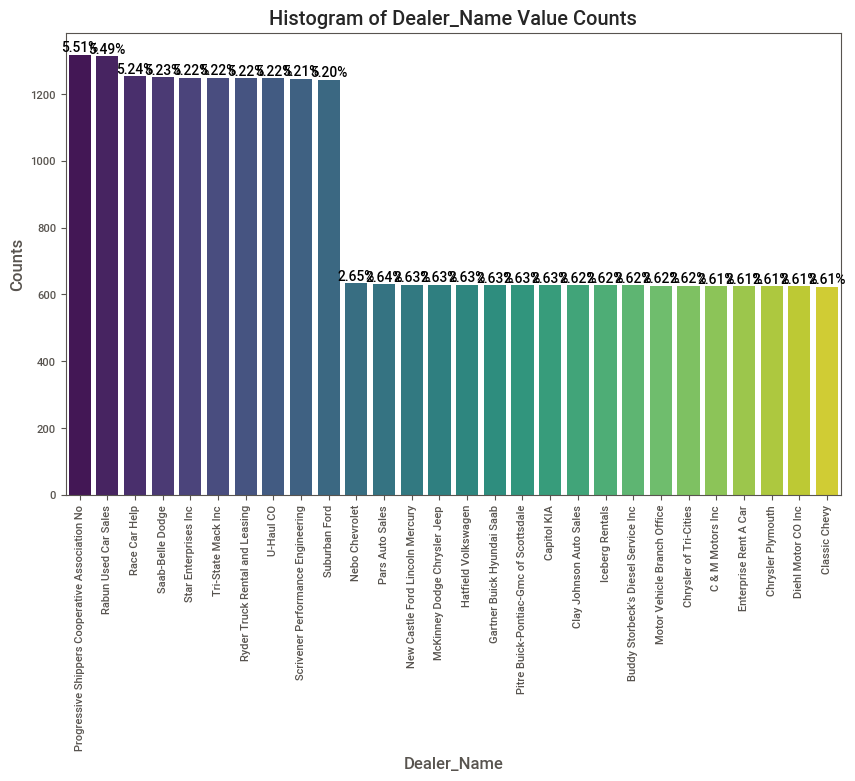

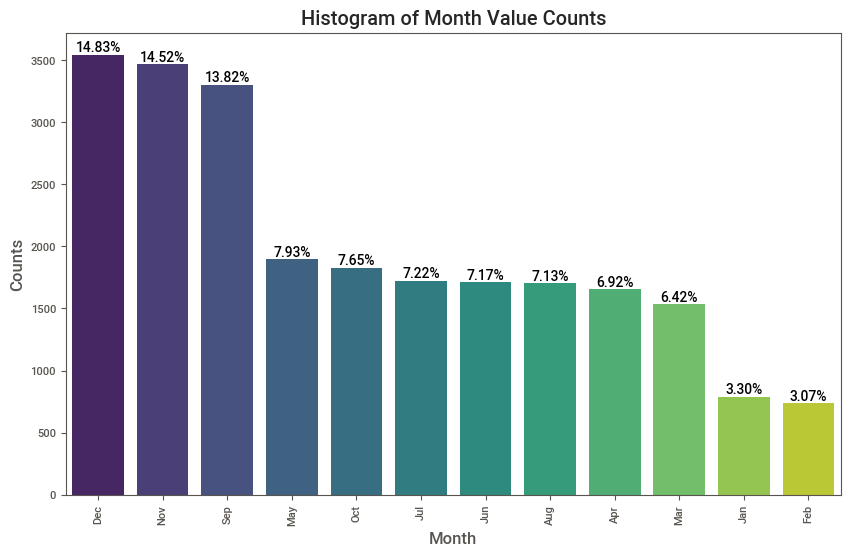

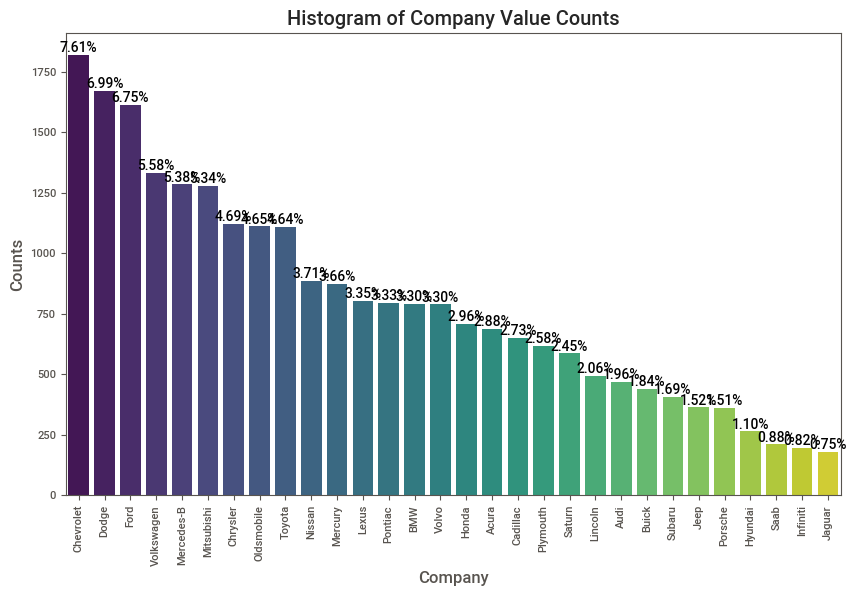

In [ ]:
plot_value_counts(df, 'Dealer_Name')
plot_value_counts(df, 'Month')
plot_value_counts(df, 'Company')

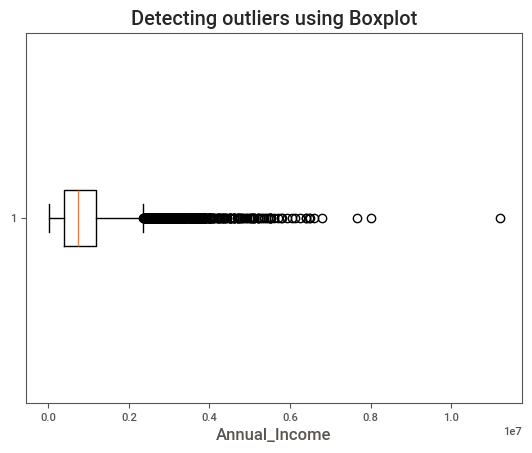

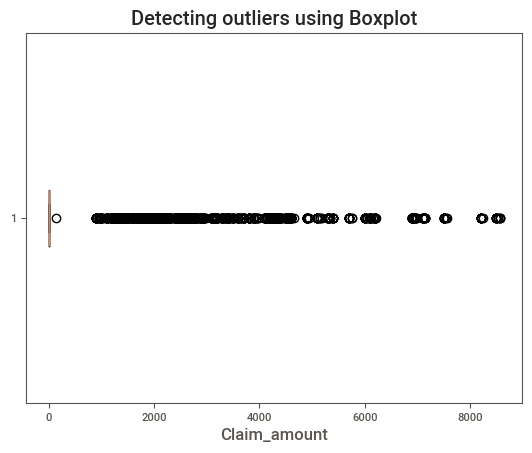

In [ ]:
import matplotlib.pyplot as plt

def detect_outliers_boxplot(data, column, vert=False):
    """
    Plot a boxplot to detect outliers in a column of the DataFrame.
    """
    # Plot the boxplot
    plt.boxplot(data[column], vert=vert)
    plt.title("Detecting outliers using Boxplot")
    plt.xlabel(column)
    plt.show()

detect_outliers_boxplot(df, 'Annual_Income', vert=False)
detect_outliers_boxplot(df, 'Claim_amount', vert=False)

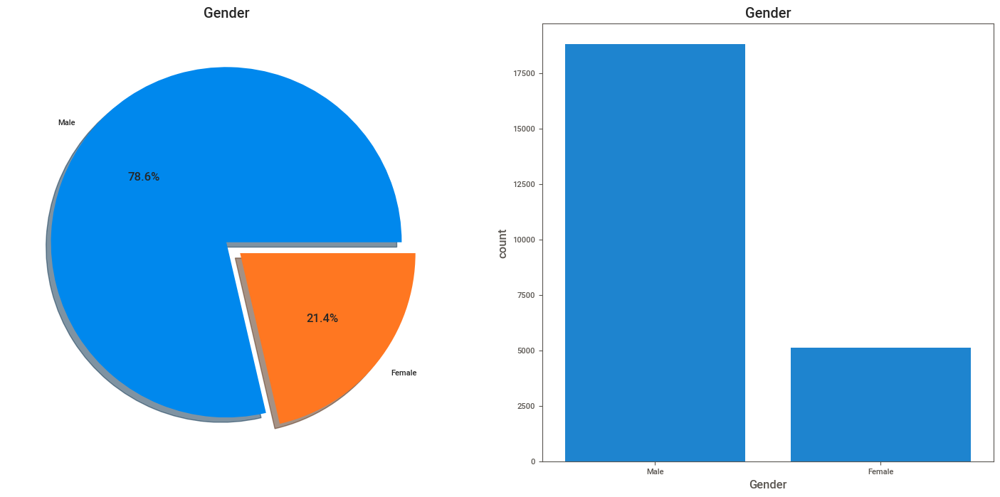

In [ ]:
f, ax = plt.subplots(1, 2, figsize=(18, 8))
df['Gender'].value_counts().plot.pie(explode=[0, 0.1], autopct='%1.1f%%', ax=ax[0], shadow=True)
ax[0].set_title('Gender')
ax[0].set_ylabel('')
sns.countplot(x='Gender', data=df, ax=ax[1])
ax[1].set_title('Gender')
plt.show()

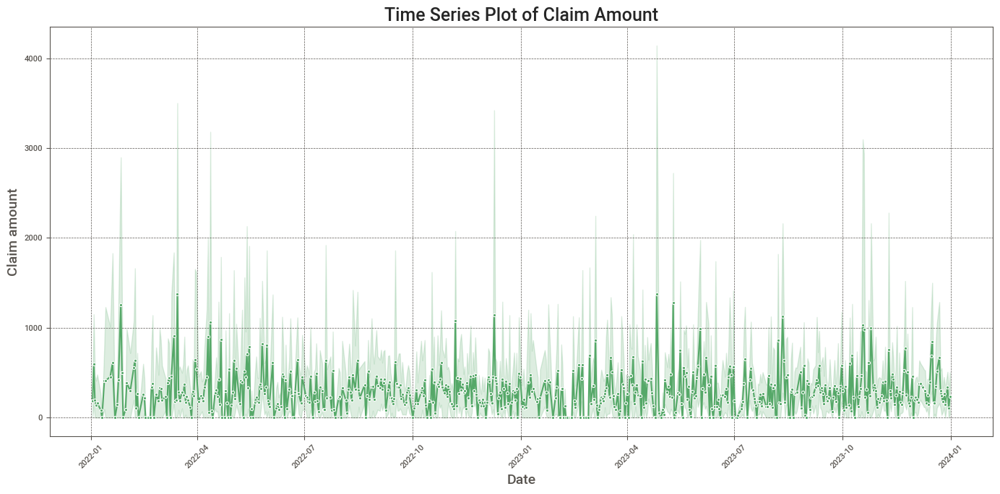

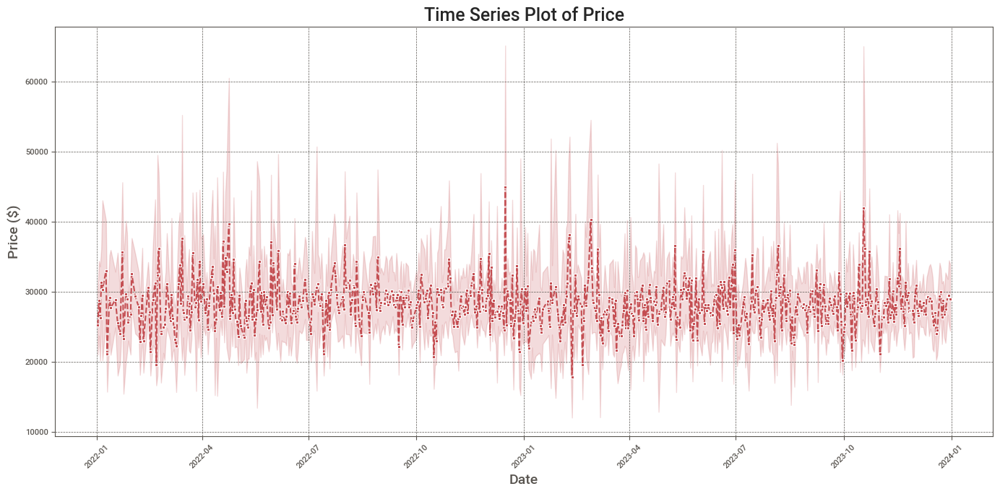

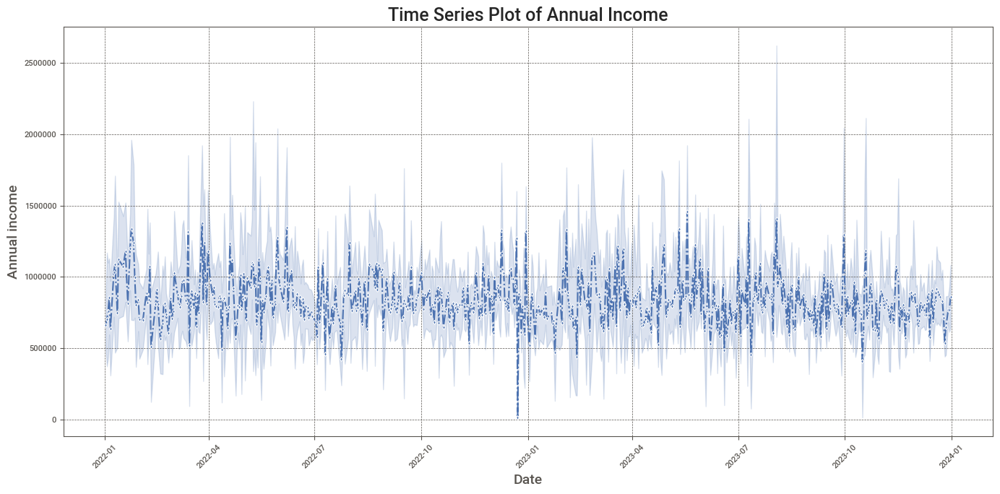

In [ ]:

import matplotlib.pyplot as plt
import seaborn as sns

def setup_plot(figsize=(14, 7)):
    plt.figure(figsize=figsize)

def plot_data(df, x_column, y_column, line_style='-', marker=None, color='b'):
    sns.lineplot(x=x_column, y=y_column, data=df, linestyle=line_style, marker=marker, color=color)

def customize_plot(x_column, y_column, title):
    plt.title(title, fontsize=18, weight='bold')
    plt.xlabel(x_column.replace('_', ' ').capitalize(), fontsize=14)
    plt.ylabel(y_column.replace('_', ' ').capitalize(), fontsize=14)
    plt.xticks(rotation=45)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)

def finalize_and_show_plot():
    plt.tight_layout()
    plt.show()

# Example usage of divided functions
def plot_time_series(df, x_column, y_column, title, line_style='-', marker=None, color='b'):
    setup_plot(figsize=(14, 7))
    plot_data(df, x_column, y_column, line_style=line_style, marker=marker, color=color)
    customize_plot(x_column, y_column, title)
    finalize_and_show_plot()

# Using the divided functions
plot_time_series(df, 'Date', 'Claim_amount', 'Time Series Plot of Claim Amount', line_style='-', marker='o', color='g')
plot_time_series(df, 'Date', 'Price_($)', 'Time Series Plot of Price', line_style='--', marker='s', color='r')
plot_time_series(df, 'Date', 'Annual_Income', 'Time Series Plot of Annual Income', line_style='-.', marker='d', color='b')


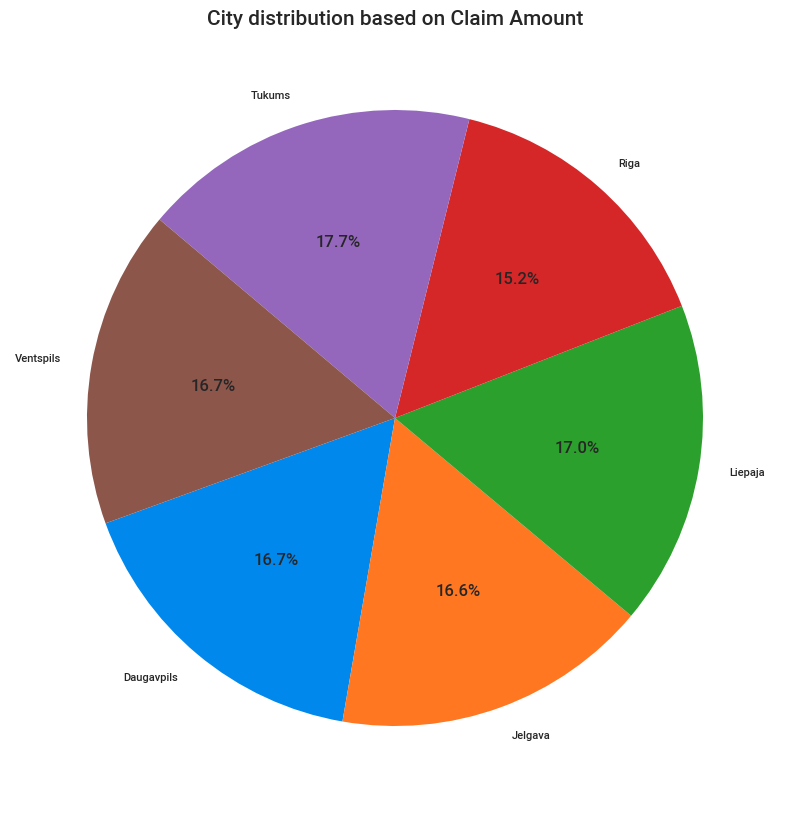

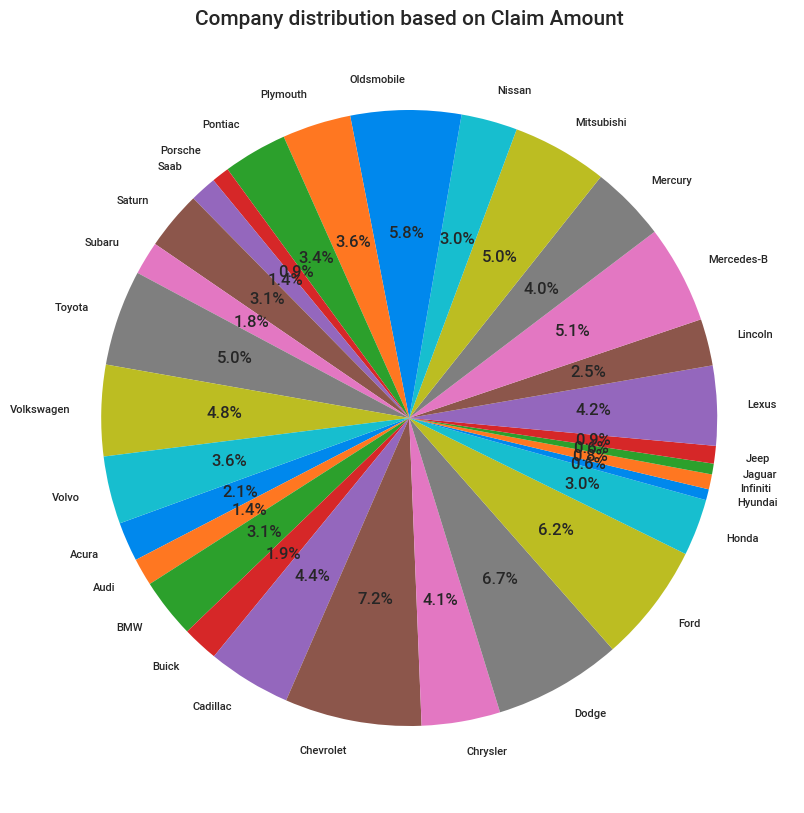

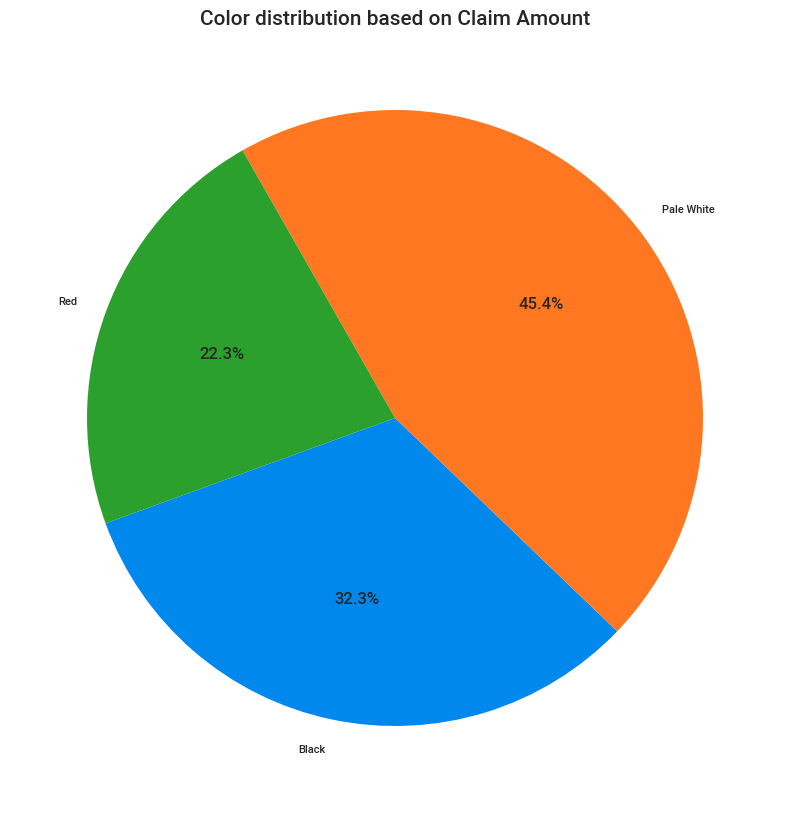

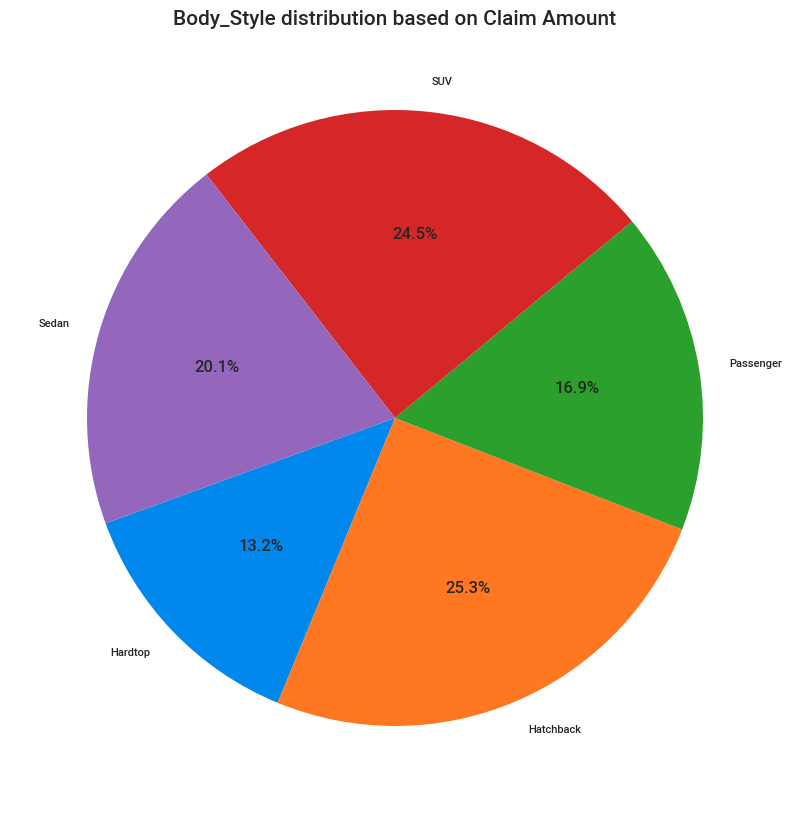

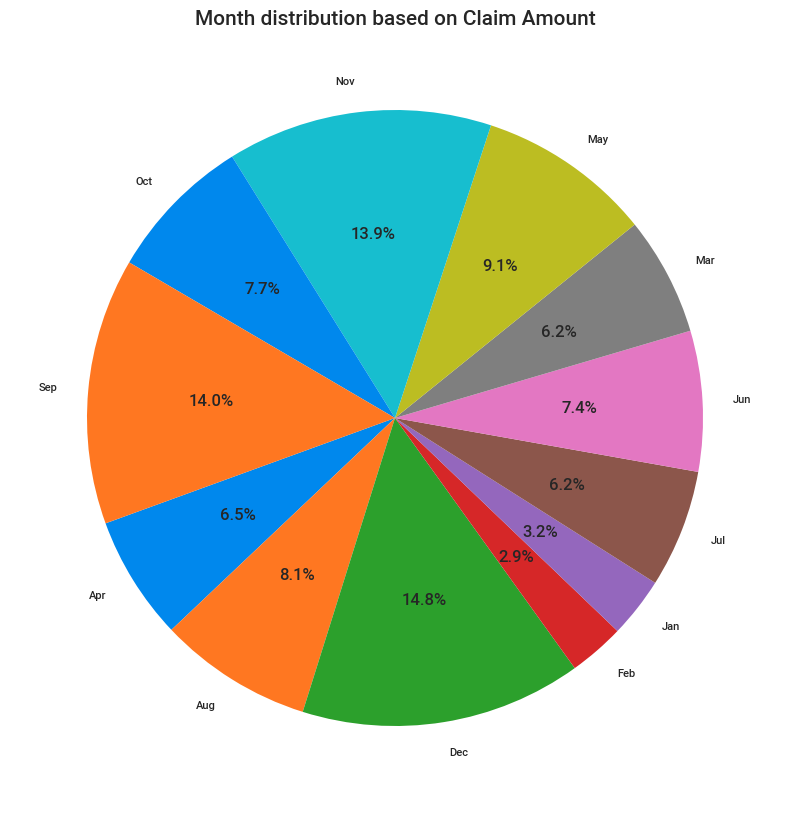

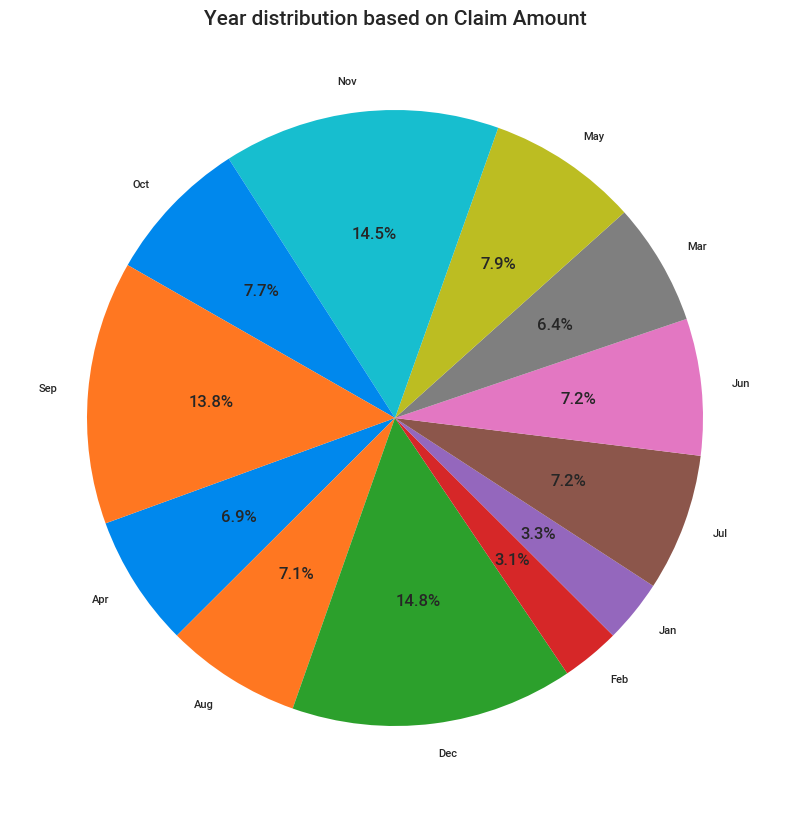

In [ ]:
import matplotlib.pyplot as plt

def plot_pie_distribution(df, groupby_column, value_column, title):
    plt.figure(figsize=(10,10))

    # Grouping the data by the specified column and summing the specified value column
    grouped_data = df.groupby(groupby_column)[value_column].sum()

    labels = grouped_data.index
    sizes = (grouped_data / grouped_data.sum()) * 100

    plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=200)
    plt.title(title, fontsize=15)
    plt.show()


plot_pie_distribution(df, 'City', 'Claim_amount', 'City distribution based on Claim Amount')
plot_pie_distribution(df, 'Company', 'Claim_amount', 'Company distribution based on Claim Amount')
plot_pie_distribution(df, 'Color', 'Claim_amount', 'Color distribution based on Claim Amount')
plot_pie_distribution(df, 'Body_Style', 'Claim_amount', 'Body_Style distribution based on Claim Amount')
plot_pie_distribution(df, 'Month', 'Claim_amount', 'Month distribution based on Claim Amount')
plot_pie_distribution(df, 'Month', 'Year', 'Year distribution based on Claim Amount')

In [ ]:
plotPerColumnDistribution(df, 10, 5)

In [ ]:
df.head()

,Date,Gender,Annual_Income,Dealer_Name,Company,Model,Engine,Color,Price_($),Body_Style,Claim_amount,City,Year,Month,Day
0,2022-01-02,Male,13500,Buddy Storbeck's Diesel Service Inc,Ford,Expedition,DoubleÃ‚Â Overhead Camshaft,Black,26000,SUV,0.00,Riga,2022,Jan,2
1,2022-01-02,Male,1480000,C & M Motors Inc,Dodge,Durango,DoubleÃ‚Â Overhead Camshaft,Black,19000,SUV,1900.00,Liepaja,2022,Jan,2
2,2022-01-02,Male,1035000,Capitol KIA,Cadillac,Eldorado,Overhead Camshaft,Red,31500,Passenger,0.00,Riga,2022,Jan,2
3,2022-01-02,Male,13500,Chrysler of Tri-Cities,Toyota,Celica,Overhead Camshaft,Pale White,14000,SUV,0.00,Jelgava,2022,Jan,2
4,2022-01-02,Male,1465000,Chrysler Plymouth,Acura,TL,DoubleÃ‚Â Overhead Camshaft,Red,24500,Hatchback,2450.00,Liepaja,2022,Jan,2


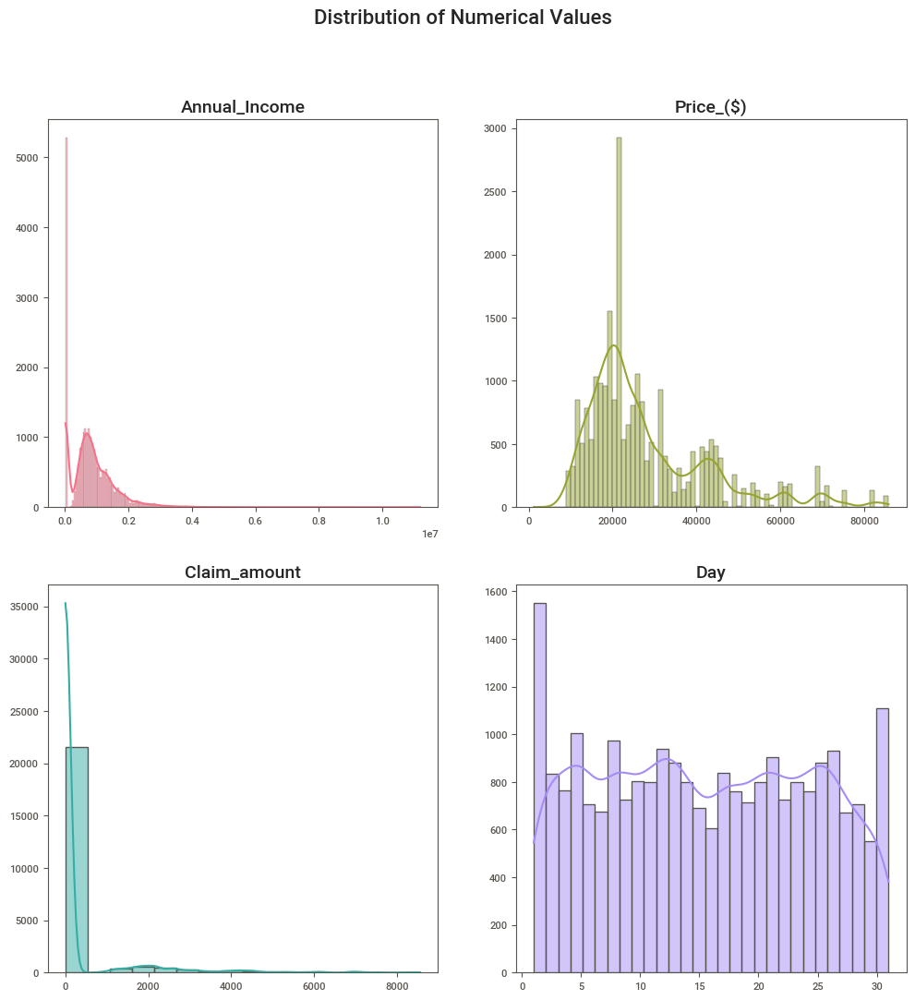

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of numerical columns to plot
num_list = ['Annual_Income', 'Price_($)', 'Claim_amount', 'Day']

# Define a color palette
colors = sns.color_palette('husl', len(num_list))

# Set up the figure and title
plt.figure(figsize=(12, 12))
plt.tight_layout(pad=3.0)
plt.suptitle("Distribution of Numerical Values", fontsize=16)

# Iterate over the numerical columns and create subplots
for idx, (col, color) in enumerate(zip(num_list, colors), start=1):
    plt.subplot(2, 2, idx)
    sns.histplot(df[col], kde=True, color=color)
    plt.title(col, fontsize=14)
    plt.xlabel('')
    plt.ylabel('')

# Display the plots
plt.show()

In [ ]:
df.head()

,Date,Gender,Annual_Income,Dealer_Name,Company,Model,Engine,Color,Price_($),Body_Style,Claim_amount,City,Year,Month,Day
0,2022-01-02,Male,13500,Buddy Storbeck's Diesel Service Inc,Ford,Expedition,DoubleÃ‚Â Overhead Camshaft,Black,26000,SUV,0.00,Riga,2022,Jan,2
1,2022-01-02,Male,1480000,C & M Motors Inc,Dodge,Durango,DoubleÃ‚Â Overhead Camshaft,Black,19000,SUV,1900.00,Liepaja,2022,Jan,2
2,2022-01-02,Male,1035000,Capitol KIA,Cadillac,Eldorado,Overhead Camshaft,Red,31500,Passenger,0.00,Riga,2022,Jan,2
3,2022-01-02,Male,13500,Chrysler of Tri-Cities,Toyota,Celica,Overhead Camshaft,Pale White,14000,SUV,0.00,Jelgava,2022,Jan,2
4,2022-01-02,Male,1465000,Chrysler Plymouth,Acura,TL,DoubleÃ‚Â Overhead Camshaft,Red,24500,Hatchback,2450.00,Liepaja,2022,Jan,2


In [ ]:
def drop_column(df, column_name):
    """
    Drop a specified column from the DataFrame.
    """
    return df.drop(columns=[column_name])

In [ ]:
# Drop a column (e.g., 'Day')
df = drop_column(df, 'Date')

In [ ]:
df.head()

,Gender,Annual_Income,Dealer_Name,Company,Model,Engine,Color,Price_($),Body_Style,Claim_amount,City,Year,Month,Day
0,Male,13500,Buddy Storbeck's Diesel Service Inc,Ford,Expedition,DoubleÃ‚Â Overhead Camshaft,Black,26000,SUV,0.00,Riga,2022,Jan,2
1,Male,1480000,C & M Motors Inc,Dodge,Durango,DoubleÃ‚Â Overhead Camshaft,Black,19000,SUV,1900.00,Liepaja,2022,Jan,2
2,Male,1035000,Capitol KIA,Cadillac,Eldorado,Overhead Camshaft,Red,31500,Passenger,0.00,Riga,2022,Jan,2
3,Male,13500,Chrysler of Tri-Cities,Toyota,Celica,Overhead Camshaft,Pale White,14000,SUV,0.00,Jelgava,2022,Jan,2
4,Male,1465000,Chrysler Plymouth,Acura,TL,DoubleÃ‚Â Overhead Camshaft,Red,24500,Hatchback,2450.00,Liepaja,2022,Jan,2


In [ ]:
df.to_csv("features.csv")

In [ ]:
fixdq = FixDQ()
fixdq.detect_duplicates(df)
data_cleaning_suggestions(df)

    All variables classified into correct types.


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Gender,object,0.000000,0,,,No issue
Annual_Income,int64,0.000000,10,10080.000000,11200000.000000,Column has 816 outliers greater than upper bound (2360375.00) or lower than lower bound(-798625.00). Cap them or remove them.
Dealer_Name,object,0.000000,0,,,No issue
Company,object,0.000000,0,,,"3 rare categories: ['Saab', 'Infiniti', 'Jaguar']. Group them into a single category or drop the categories."
Model,object,0.000000,0,,,Possible high cardinality column with 154 unique values: Use hash encoding or text embedding to reduce dimension.
Engine,object,0.000000,0,,,No issue
Color,object,0.000000,0,,,No issue
Price_($),int64,0.000000,3,1200.000000,85800.000000,Column has 1449 outliers greater than upper bound (57998.50) or lower than lower bound(-5997.50). Cap them or remove them.
Body_Style,object,0.000000,0,,,No issue
Claim_amount,float64,0.000000,NA,0.000000,8560.000000,Column has 2390 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Gender,object,0.00,0,,,No issue
Annual_Income,int64,0.00,10,10080.00,11200000.00,Column has 816 outliers greater than upper bound (2360375.00) or lower than lower bound(-798625.00). Cap them or remove them.
Dealer_Name,object,0.00,0,,,No issue
Company,object,0.00,0,,,"3 rare categories: ['Saab', 'Infiniti', 'Jaguar']. Group them into a single category or drop the categories."
Model,object,0.00,0,,,Possible high cardinality column with 154 unique values: Use hash encoding or text embedding to reduce dimension.
Engine,object,0.00,0,,,No issue
Color,object,0.00,0,,,No issue
Price_($),int64,0.00,3,1200.00,85800.00,Column has 1449 outliers greater than upper bound (57998.50) or lower than lower bound(-5997.50). Cap them or remove them.
Body_Style,object,0.00,0,,,No issue
Claim_amount,float64,0.00,NA,0.00,8560.00,Column has 2390 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.


In [ ]:
from sklearn.preprocessing import LabelEncoder

def label_encode_column(df, column_name):
    """
    Performs label encoding on the specified column of a DataFrame.
    """
    label_encoder = LabelEncoder()
    df[column_name] = label_encoder.fit_transform(df[column_name])
    return df


df = label_encode_column(df, 'Body_Style')
df = label_encode_column(df, 'Color')
df = label_encode_column(df, 'Engine')
df = label_encode_column(df, 'Model')
df = label_encode_column(df, 'City')
df = label_encode_column(df, 'Month')
df = label_encode_column(df, 'Gender')
df = label_encode_column(df, 'Company')
df = label_encode_column(df, 'Dealer_Name')

In [ ]:
df

,Gender,Annual_Income,Dealer_Name,Company,Model,Engine,Color,Price_($),Body_Style,Claim_amount,City,Year,Month,Day
0,1,13500,0,8,60,0,0,26000,3,0.00,3,2022,4,2
1,1,1480000,1,7,52,0,0,19000,3,1900.00,2,2022,4,2
2,1,1035000,2,4,57,1,2,31500,2,0.00,3,2022,4,2
3,1,13500,4,27,36,1,1,14000,3,0.00,1,2022,4,2
4,1,1465000,3,0,141,0,2,24500,1,2450.00,2,2022,4,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23901,1,13500,1,21,150,1,2,12000,2,1200.00,4,2023,2,31
23902,0,900000,21,5,109,0,0,16000,0,0.00,2,2023,2,31
23903,1,705000,4,2,5,1,2,21000,4,0.00,2,2023,2,31
23904,1,13500,3,5,93,0,0,31000,2,3100.00,4,2023,2,31


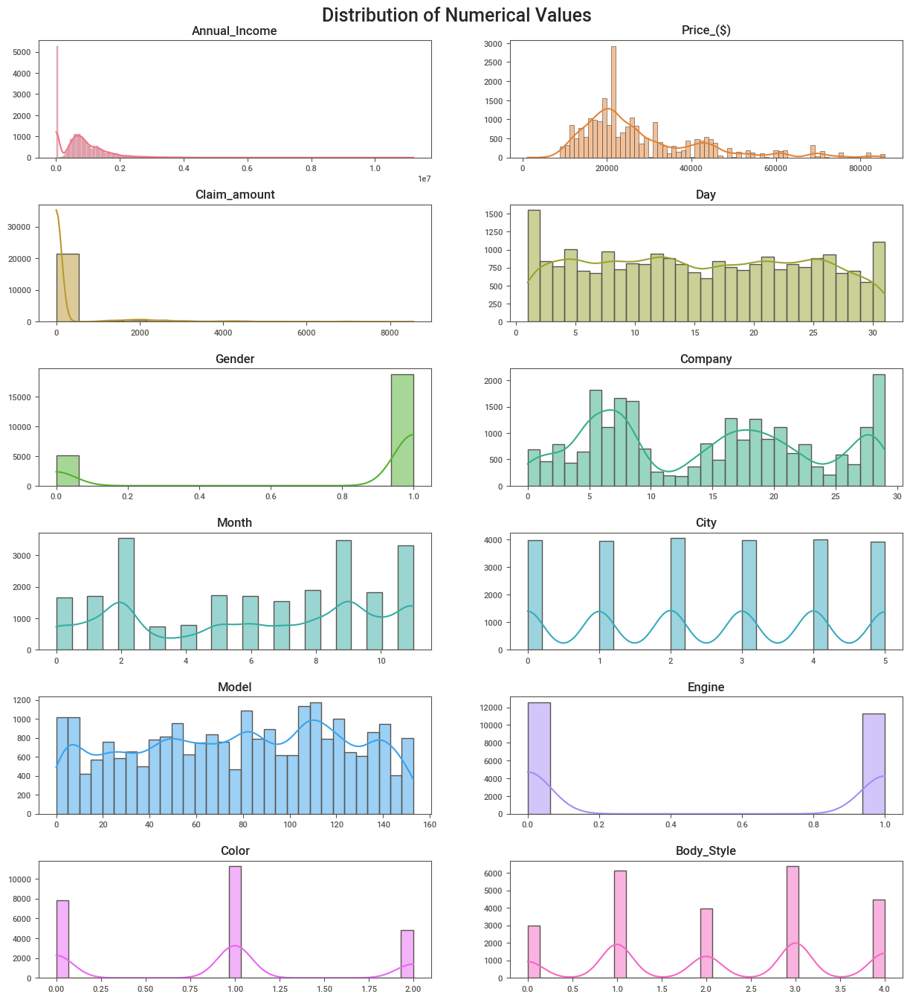

In [ ]:
# List of numerical columns to plot
num_list = ['Annual_Income', 'Price_($)', 'Claim_amount', 'Day', 'Gender', 'Company', 'Month', 'City', 'Model', 'Engine', 'Color', 'Body_Style']

# Define a color palette
colors = sns.color_palette('husl', len(num_list))

# Calculate the number of rows and columns needed for subplots
n_cols = 2
n_rows = math.ceil(len(num_list) / n_cols)

# Set up the figure and title
plt.figure(figsize=(15, 15))
plt.tight_layout(pad=3.0)
plt.suptitle("Distribution of Numerical Values", fontsize=18)

# Iterate over the numerical columns and create subplots
for idx, (col, color) in enumerate(zip(num_list, colors), start=1):
    plt.subplot(n_rows, n_cols, idx)
    sns.histplot(df[col], kde=True, color=color)
    plt.title(col, fontsize=12)
    plt.xlabel('')
    plt.ylabel('')

# Adjust layout to make room for the main title
plt.subplots_adjust(top=0.95, hspace=0.4)

# Display the plots
plt.show()


In [ ]:
df.head()

,Gender,Annual_Income,Dealer_Name,Company,Model,Engine,Color,Price_($),Body_Style,Claim_amount,City,Year,Month,Day
0,1,13500,0,8,60,0,0,26000,3,0.00,3,2022,4,2
1,1,1480000,1,7,52,0,0,19000,3,1900.00,2,2022,4,2
2,1,1035000,2,4,57,1,2,31500,2,0.00,3,2022,4,2
3,1,13500,4,27,36,1,1,14000,3,0.00,1,2022,4,2
4,1,1465000,3,0,141,0,2,24500,1,2450.00,2,2022,4,2


In [ ]:
def replace_non_zero_with_one(x):
    """
    Replace non-zero values with 1, leave zero values unchanged.
    """
    if x != 0:
        return 1
    else:
        return x

# Apply the function to the 'claim_amount' column
df['Claim_amount'] = df['Claim_amount'].apply(replace_non_zero_with_one)

In [ ]:
df.head()

,Gender,Annual_Income,Dealer_Name,Company,Model,Engine,Color,Price_($),Body_Style,Claim_amount,City,Year,Month,Day
0,1,13500,0,8,60,0,0,26000,3,0.00,3,2022,4,2
1,1,1480000,1,7,52,0,0,19000,3,1.00,2,2022,4,2
2,1,1035000,2,4,57,1,2,31500,2,0.00,3,2022,4,2
3,1,13500,4,27,36,1,1,14000,3,0.00,1,2022,4,2
4,1,1465000,3,0,141,0,2,24500,1,1.00,2,2022,4,2


In [ ]:
fixdq = FixDQ()
fixdq.detect_duplicates(df)
data_cleaning_suggestions(df)

    All variables classified into correct types.


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Gender,int64,0.000000,0,0.000000,1.000000,No issue
Annual_Income,int64,0.000000,10,10080.000000,11200000.000000,Column has 816 outliers greater than upper bound (2360375.00) or lower than lower bound(-798625.00). Cap them or remove them.
Dealer_Name,int64,0.000000,0,0.000000,27.000000,No issue
Company,int64,0.000000,0,0.000000,29.000000,No issue
Model,int64,0.000000,0,0.000000,153.000000,No issue
Engine,int64,0.000000,0,0.000000,1.000000,No issue
Color,int64,0.000000,0,0.000000,2.000000,No issue
Price_($),int64,0.000000,3,1200.000000,85800.000000,Column has 1449 outliers greater than upper bound (57998.50) or lower than lower bound(-5997.50). Cap them or remove them.
Body_Style,int64,0.000000,0,0.000000,4.000000,No issue
Claim_amount,float64,0.000000,0,0.000000,1.000000,No issue


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Gender,int64,0.00,0,0.00,1.00,No issue
Annual_Income,int64,0.00,10,10080.00,11200000.00,Column has 816 outliers greater than upper bound (2360375.00) or lower than lower bound(-798625.00). Cap them or remove them.
Dealer_Name,int64,0.00,0,0.00,27.00,No issue
Company,int64,0.00,0,0.00,29.00,No issue
Model,int64,0.00,0,0.00,153.00,No issue
Engine,int64,0.00,0,0.00,1.00,No issue
Color,int64,0.00,0,0.00,2.00,No issue
Price_($),int64,0.00,3,1200.00,85800.00,Column has 1449 outliers greater than upper bound (57998.50) or lower than lower bound(-5997.50). Cap them or remove them.
Body_Style,int64,0.00,0,0.00,4.00,No issue
Claim_amount,float64,0.00,0,0.00,1.00,No issue


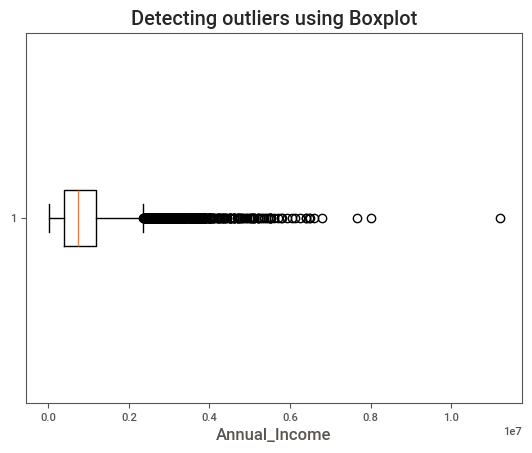

In [ ]:
import matplotlib.pyplot as plt

def detect_outliers_boxplot(data, column, vert=False):
    """
    Plot a boxplot to detect outliers in a column of the DataFrame.
    """
    # Plot the boxplot
    plt.boxplot(data[column], vert=vert)
    plt.title("Detecting outliers using Boxplot")
    plt.xlabel(column)
    plt.show()

detect_outliers_boxplot(df, 'Annual_Income', vert=False)

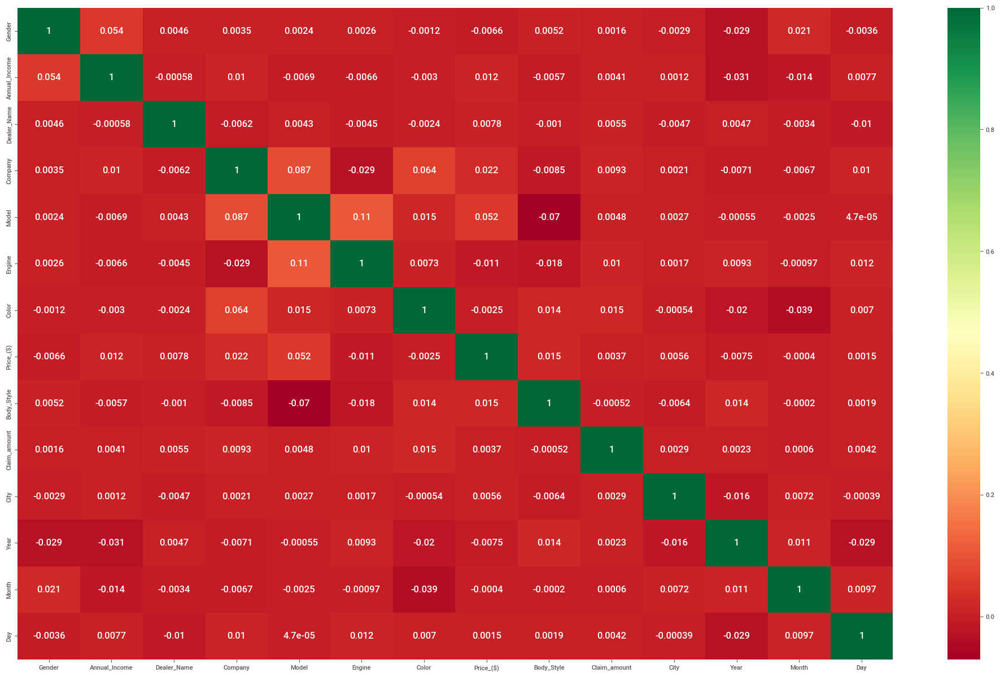

In [ ]:
%matplotlib inline
plt.figure(figsize=(25,15))
sns.heatmap(df.corr(),annot=True,cmap="PiYG")
plt.show()

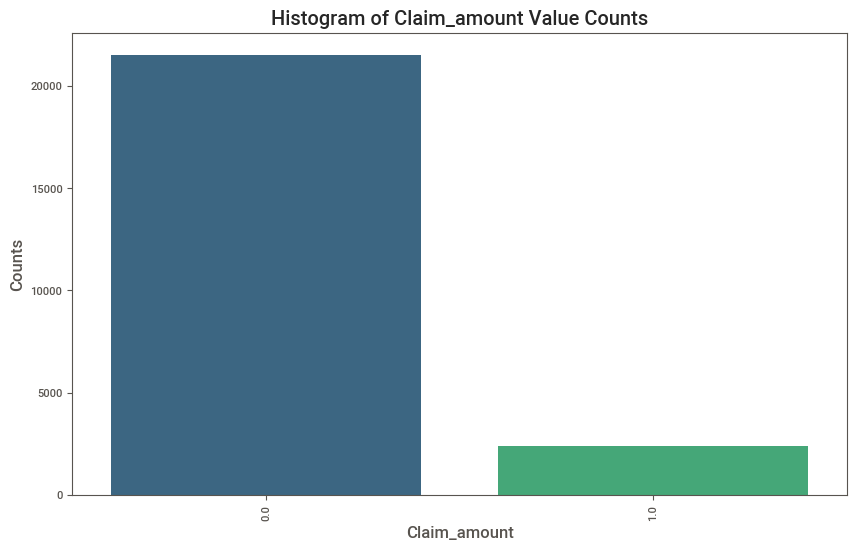

In [ ]:
plot_value_counts(df, 'Claim_amount')

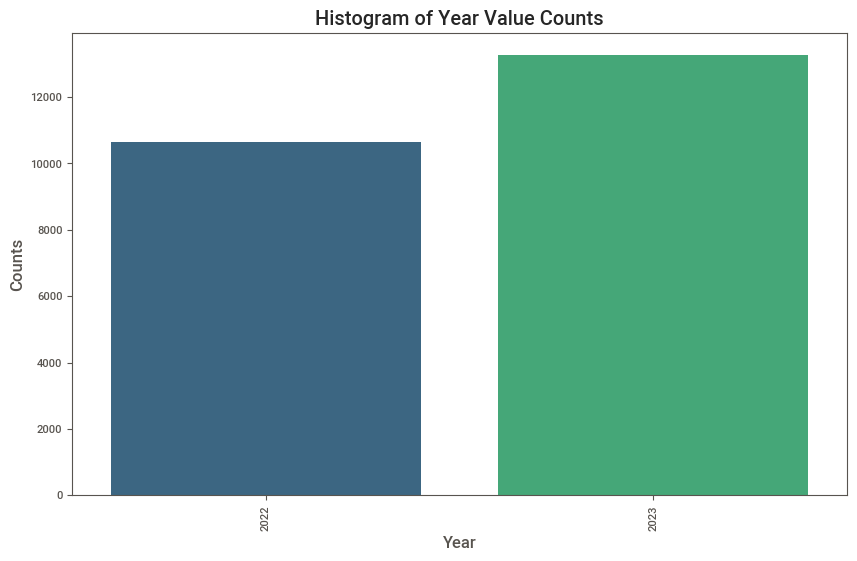

In [ ]:
plot_value_counts(df, 'Year')

In [ ]:
# Define a list of dataframes and their corresponding labels
datasets = [(df, "Dataset Exploration")]

# Loop through each dataframe and label pair
for df, label in datasets:
    print("================================={}=================================".format(label))
    explore_dataframe(df)

=================================Dataset Exploration=================================
-----------------------------------Shape Of Data-------------------------------------
(23906, 14)


-----------------------------------Top 5 Records-------------------------------------
+----+----------+-----------------+---------------+-----------+---------+----------+---------+-------------+--------------+----------------+--------+--------+---------+-------+
|    |   Gender |   Annual_Income |   Dealer_Name |   Company |   Model |   Engine |   Color |   Price_($) |   Body_Style |   Claim_amount |   City |   Year |   Month |   Day |
|----+----------+-----------------+---------------+-----------+---------+----------+---------+-------------+--------------+----------------+--------+--------+---------+-------|
|  0 |        1 |   13500         |             0 |         8 |      60 |        0 |       0 |       26000 |            3 |              0 |      3 |   2022 |       4 |     2 |
|  1 |        1 |   

### Trends

* **Trend in Car Prices by Year**:
shows a clear upward trend in car prices over the given year range. The data points form an increasing pattern, and the fitted line has a positive slope, indicating that car prices tend to rise year after year. The steep slope suggests a substantial increase in car prices during the observed time period.

* **Trend in Claim Amounts by Year**:
shows a steady trend in car prices over the given year range. The data points form are not increasing over the period of time.

* **Trend in Annual Income by Year**:
Similarly, the image does not include the plot for the "**Annual_Income**" column. However, the provided code should create a line plot with the "Year" column on the x-axis and the "**Annual_Income**" column on the y-axis. By inspecting this plot, you can assess whether there is an upward, downward, or flat trend in annual income levels over the given year range.

### Seasonality

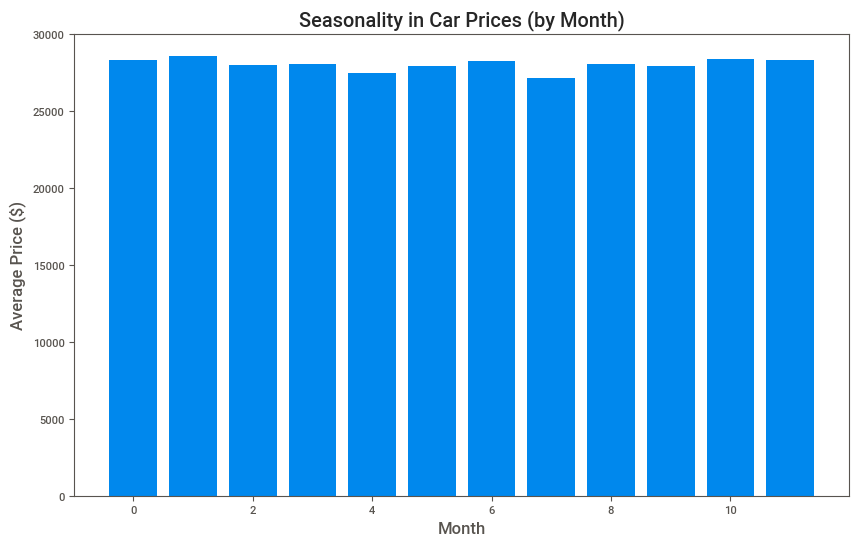

In [ ]:
import matplotlib.pyplot as plt

def plot_seasonality_by_month(df, month_column, price_column):
    """
    Plot the seasonality in car prices by month.
    """
    plt.figure(figsize=(10, 6))
    monthly_data = df.groupby(month_column)[price_column].mean().reset_index()
    plt.bar(monthly_data[month_column], monthly_data[price_column])
    plt.title('Seasonality in Car Prices (by Month)')
    plt.xlabel('Month')
    plt.ylabel('Average Price ($)')
    plt.show()

# Call the function with your dataframe and column names
plot_seasonality_by_month(df, 'Month', 'Price_($)')

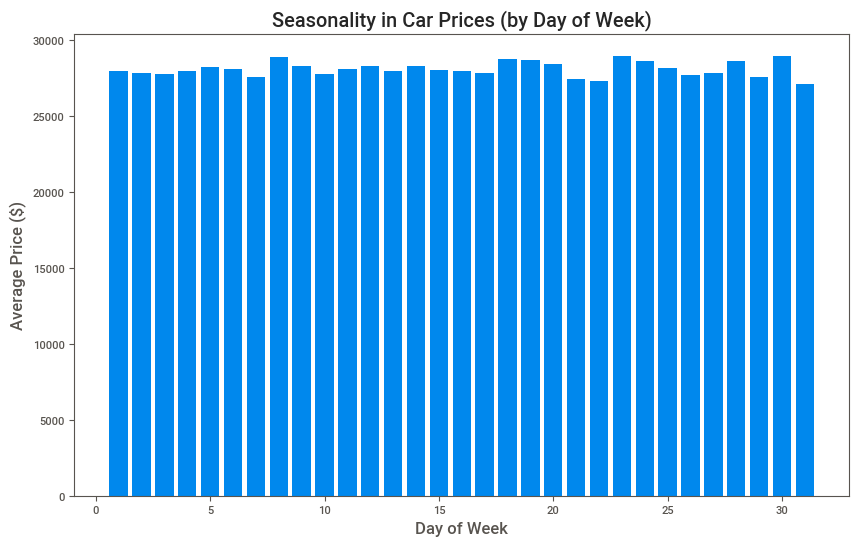

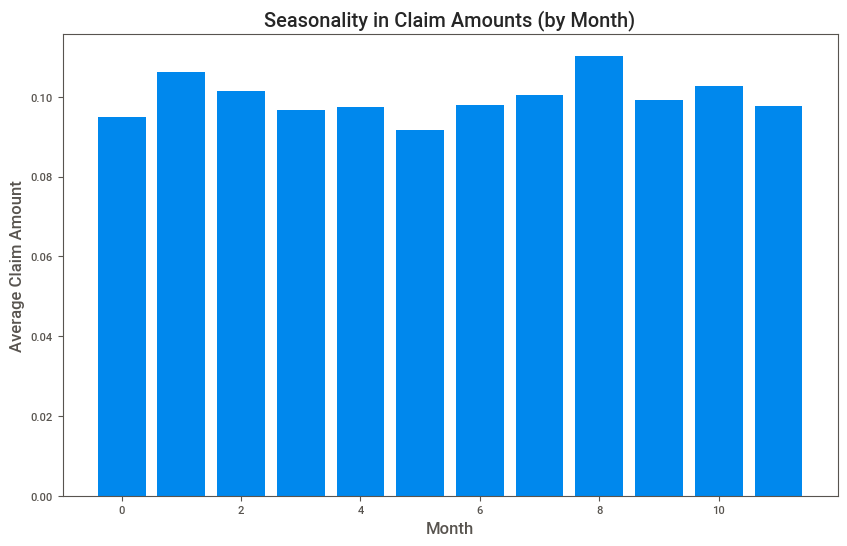

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Seasonality by Day
plt.figure(figsize=(10, 6))
daily_data = df.groupby('Day')['Price_($)'].mean().reset_index()
plt.bar(daily_data['Day'], daily_data['Price_($)'])
plt.title('Seasonality in Car Prices (by Day of Week)')
plt.xlabel('Day of Week')
plt.ylabel('Average Price ($)')
plt.show()

# Seasonality by Month for Claim Amounts
plt.figure(figsize=(10, 6))
monthly_claim_data = df.groupby('Month')['Claim_amount'].mean().reset_index()
plt.bar(monthly_claim_data['Month'], monthly_claim_data['Claim_amount'])
plt.title('Seasonality in Claim Amounts (by Month)')
plt.xlabel('Month')
plt.ylabel('Average Claim Amount')
plt.show()

### Autocorrelation

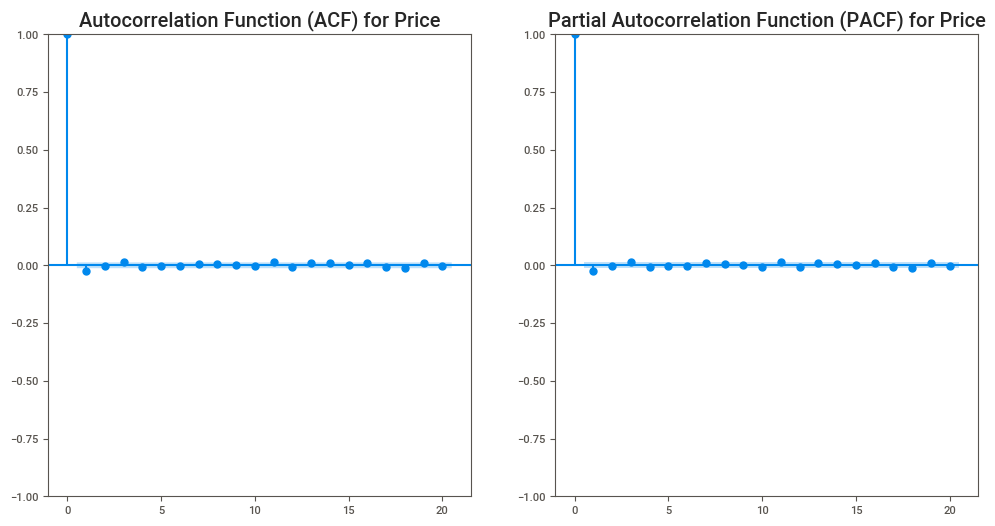

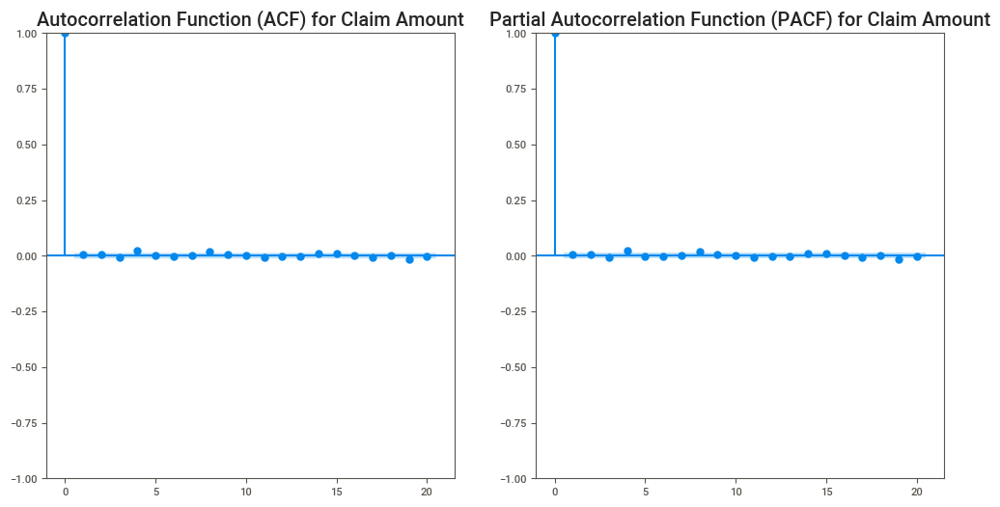

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Assuming you have loaded your data into a DataFrame 'df'

# Autocorrelation for Price_($)
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plot_acf(df['Price_($)'], lags=20, ax=plt.gca())
plt.title('Autocorrelation Function (ACF) for Price')

plt.subplot(1, 2, 2)
plot_pacf(df['Price_($)'], lags=20, ax=plt.gca())
plt.title('Partial Autocorrelation Function (PACF) for Price')
plt.show()

# Autocorrelation for Claim_amount
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plot_acf(df['Claim_amount'], lags=20, ax=plt.gca())
plt.title('Autocorrelation Function (ACF) for Claim Amount')

plt.subplot(1, 2, 2)
plot_pacf(df['Claim_amount'], lags=20, ax=plt.gca())
plt.title('Partial Autocorrelation Function (PACF) for Claim Amount')
plt.show()

In [ ]:
df['Claim_amount'] = df['Claim_amount'].astype(int)

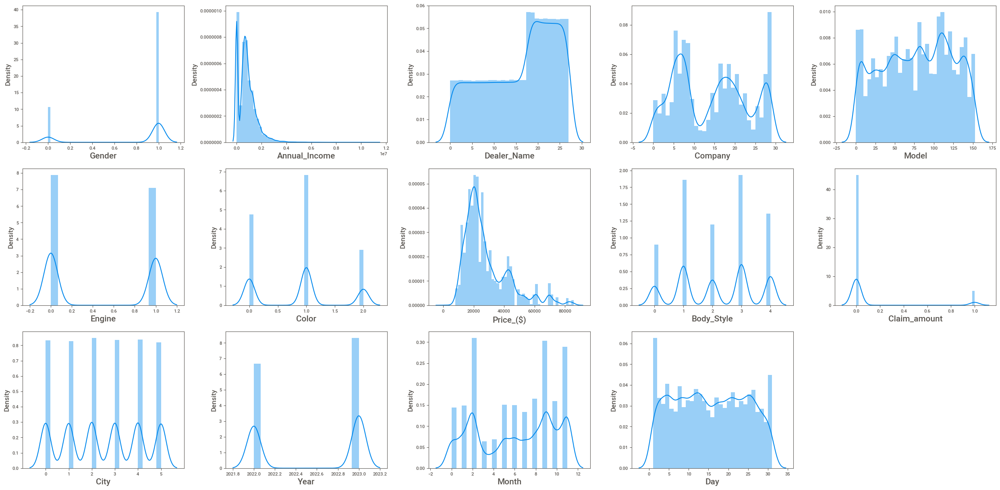

In [ ]:
plt.figure(figsize = (25, 20))
plotnumber = 1

for col in df.columns:
    if plotnumber <= 24:
        ax = plt.subplot(5, 5, plotnumber)
        sns.distplot(df[col])
        plt.xlabel(col, fontsize = 15)

    plotnumber += 1

plt.tight_layout()
plt.show()

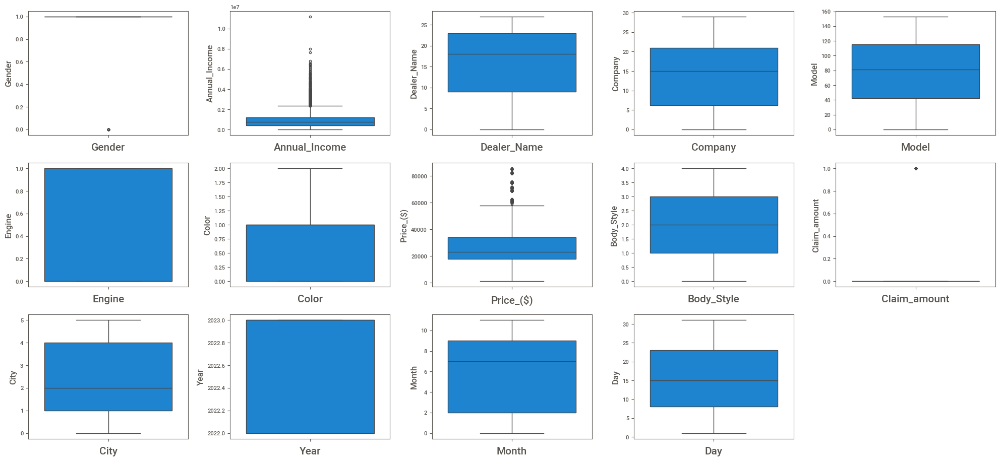

In [ ]:
plt.figure(figsize = (20, 15))
plotnumber = 1

for col in df.columns:
    if plotnumber <= 24:
        ax = plt.subplot(5, 5, plotnumber)
        sns.boxplot(df[col])
        plt.xlabel(col, fontsize = 15)

    plotnumber += 1
plt.tight_layout()
plt.show()

### Split into training and testing

In [ ]:
df.head()

,Gender,Annual_Income,Dealer_Name,Company,Model,Engine,Color,Price_($),Body_Style,Claim_amount,City,Year,Month,Day
0,1,13500,0,8,60,0,0,26000,3,0,3,2022,4,2
1,1,1480000,1,7,52,0,0,19000,3,1,2,2022,4,2
2,1,1035000,2,4,57,1,2,31500,2,0,3,2022,4,2
3,1,13500,4,27,36,1,1,14000,3,0,1,2022,4,2
4,1,1465000,3,0,141,0,2,24500,1,1,2,2022,4,2


### Scaling the features

In [ ]:
y=df["Claim_amount"]
X = df.drop('Claim_amount', axis=1)

In [ ]:
from sklearn.model_selection import StratifiedShuffleSplit

# Assuming 'df' is your dataframe
y = df["Claim_amount"]
X = df.drop('Claim_amount', axis=1)

# Define the number of splits
n_splits = 1  # You can adjust the number of splits as needed

# Initialize StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=n_splits, test_size=0.2, random_state=42)

# Split the data
for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

# Now, X_train, X_test, y_train, y_test contain the stratified splits

In [ ]:
print(X_train.shape, y_train.shape)
print(X_test.shape ,  y_test.shape)

(19124, 13) (19124,)
(4782, 13) (4782,)


In [ ]:
X_train

,Gender,Annual_Income,Dealer_Name,Company,Model,Engine,Color,Price_($),Body_Style,City,Year,Month,Day
6336,1,900000,17,6,82,1,0,51000,1,3,2022,11,25
14063,1,1460000,23,16,128,1,1,17000,2,3,2023,8,26
20779,1,1360000,0,0,141,1,0,21000,1,4,2023,9,10
22606,1,262500,26,28,69,1,0,25501,3,5,2023,2,9
15664,0,13500,23,8,61,0,0,22000,1,2,2023,5,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...
16129,1,13500,9,6,41,1,0,18001,0,0,2023,5,22
23343,1,690000,12,17,148,1,1,16000,2,1,2023,2,23
3012,1,13500,9,25,83,0,1,51000,4,3,2022,6,8
5935,1,13500,19,5,109,1,1,22000,1,3,2022,11,19


In [ ]:
y_train

6336     1
14063    0
20779    0
22606    0
15664    0
        ..
16129    0
23343    0
3012     0
5935     0
79       0
Name: Claim_amount, Length: 19124, dtype: int64

In [ ]:
X_test

,Gender,Annual_Income,Dealer_Name,Company,Model,Engine,Color,Price_($),Body_Style,City,Year,Month,Day
7082,1,1355000,20,17,46,0,0,33500,1,5,2022,10,23
158,1,2750000,16,18,51,0,0,18000,1,3,2022,4,12
12133,1,13500,20,17,74,1,2,71001,3,4,2023,7,19
2637,1,706000,21,15,145,0,1,18000,1,4,2022,8,25
19132,0,500000,14,18,2,1,2,20000,4,5,2023,11,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7478,1,1110000,4,7,115,1,1,21000,0,1,2022,9,2
15389,1,500000,16,20,137,0,0,60000,4,2,2023,6,30
20368,1,1250000,25,6,133,0,1,22000,4,2,2023,9,4
583,1,480000,20,5,45,0,1,45000,3,0,2022,3,23


In [ ]:
y_test

7082     0
158      0
12133    1
2637     0
19132    1
        ..
7478     0
15389    0
20368    0
583      0
8187     0
Name: Claim_amount, Length: 4782, dtype: int64

### MinMax Scaling

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Initialize the scaler
scaler = MinMaxScaler()

# Fit and transform X_train
X_train_scaled = scaler.fit_transform(X_train)

# Transform X_test
X_test_scaled = scaler.transform(X_test)

# Reshape y_train and y_test (assuming they are 1D arrays)
y_train_reshaped = y_train.values.reshape(-1, 1)
y_test_reshaped = y_test.values.reshape(-1, 1)

# Fit and transform y_train
y_train_scaled = scaler.fit_transform(y_train_reshaped)

# Transform y_test
y_test_scaled = scaler.transform(y_test_reshaped)

print(X_train_scaled.shape,y_train_reshaped.shape)
print(X_test_scaled.shape,y_test_scaled.shape)

(19124, 13) (19124, 1)
(4782, 13) (4782, 1)


#Modelling

In [ ]:
clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train_scaled, X_test_scaled, y_train_reshaped, y_test_scaled)

models

 97%|█████████▋| 28/29 [01:50<00:07,  7.47s/it]

[LightGBM] [Info] Number of positive: 1912, number of negative: 17212
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001083 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 794
[LightGBM] [Info] Number of data points in the train set: 19124, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.099979 -> initscore=-2.197457
[LightGBM] [Info] Start training from score -2.197457


100%|██████████| 29/29 [01:50<00:00,  3.82s/it]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
Perceptron,0.82,0.51,0.51,0.82,0.07
NearestCentroid,0.51,0.50,0.50,0.60,0.04
GaussianNB,0.90,0.50,0.50,0.85,0.04
QuadraticDiscriminantAnalysis,0.90,0.50,0.50,0.85,0.05
KNeighborsClassifier,0.89,0.50,0.50,0.85,2.04
ExtraTreesClassifier,0.90,0.50,0.50,0.85,1.93
BaggingClassifier,0.90,0.50,0.50,0.85,1.66
LogisticRegression,0.90,0.50,0.50,0.85,0.06
SVC,0.90,0.50,0.50,0.85,49.37


## Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression

# Initialize the Logistic Regression model
logistic_regression = LogisticRegression(random_state=42)

# Train the model on the scaled training data
logistic_regression.fit(X_train_scaled, y_train_reshaped)

# Predict on the scaled testing data
y_pred_lr = logistic_regression.predict(X_test_scaled)


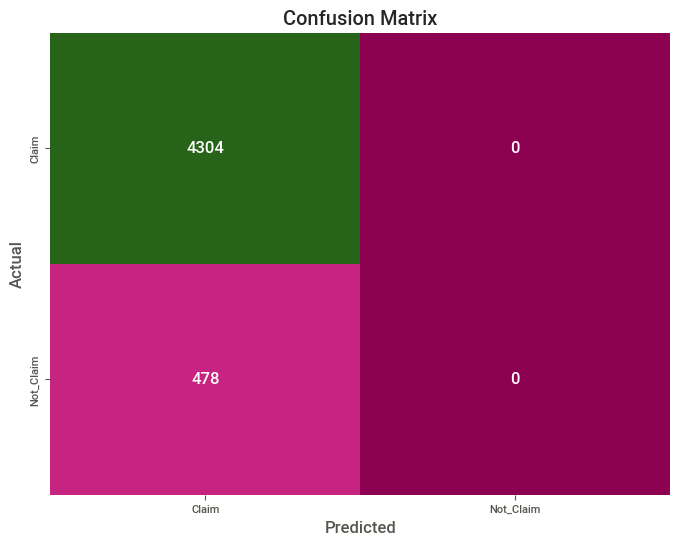

In [ ]:
# Evaluate the model (e.g., calculate accuracy, precision, recall, etc.)
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate confusion matrix
conf_matrix = confusion_matrix(y_test_scaled, y_pred_lr)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='PiYG', cbar=False, xticklabels=['Claim', 'Not_Claim'], yticklabels=['Claim', 'Not_Claim'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
# Calculate the validation metrics
accuracy = accuracy_score(y_test_scaled, y_pred_lr)
precision = precision_score(y_test_scaled, y_pred_lr, average='weighted')
recall = recall_score(y_test_scaled, y_pred_lr, average='weighted')
f1 = f1_score(y_test_scaled, y_pred_lr, average='weighted')

In [ ]:
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

Accuracy: 0.9000418235048097
Precision: 0.810075284057863
Recall: 0.9000418235048097
F1 Score: 0.8526920555502314


In [ ]:
# Calculate ROC AUC Curve
y_pred_prob_lr = logistic_regression.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, _ = roc_curve(y_test_scaled, y_pred_prob_lr)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate Precision-Recall Curve
precision, recall, _ = precision_recall_curve(y_test_scaled, y_pred_prob_lr)

plt.figure(figsize=(8, 6))
plt.plot(recall, precision, color='blue', lw=2)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

# Regression

In [ ]:
df=pd.read_csv('/content/features.csv')
df.head(10)

,Unnamed: 0,Gender,Annual_Income,Dealer_Name,Company,Model,Engine,Color,Price_($),Body_Style,Claim_amount,City,Year,Month,Day
0,0,Male,13500,Buddy Storbeck's Diesel Service Inc,Ford,Expedition,DoubleÃ‚Â Overhead Camshaft,Black,26000,SUV,0.00,Riga,2022,Jan,2
1,1,Male,1480000,C & M Motors Inc,Dodge,Durango,DoubleÃ‚Â Overhead Camshaft,Black,19000,SUV,1900.00,Liepaja,2022,Jan,2
2,2,Male,1035000,Capitol KIA,Cadillac,Eldorado,Overhead Camshaft,Red,31500,Passenger,0.00,Riga,2022,Jan,2
3,3,Male,13500,Chrysler of Tri-Cities,Toyota,Celica,Overhead Camshaft,Pale White,14000,SUV,0.00,Jelgava,2022,Jan,2
4,4,Male,1465000,Chrysler Plymouth,Acura,TL,DoubleÃ‚Â Overhead Camshaft,Red,24500,Hatchback,2450.00,Liepaja,2022,Jan,2
5,5,Male,850000,Classic Chevy,Mitsubishi,Diamante,Overhead Camshaft,Pale White,12000,Hatchback,0.00,Riga,2022,Jan,2
6,6,Male,1600000,Clay Johnson Auto Sales,Toyota,Corolla,Overhead Camshaft,Pale White,14000,Passenger,0.00,Riga,2022,Jan,2
7,7,Male,13500,U-Haul CO,Mitsubishi,Galant,DoubleÃ‚Â Overhead Camshaft,Pale White,42000,Passenger,0.00,Jelgava,2022,Jan,2
8,8,Male,815000,Rabun Used Car Sales,Chevrolet,Malibu,Overhead Camshaft,Pale White,82000,Hardtop,0.00,Ventspils,2022,Jan,2
9,9,Female,13500,Rabun Used Car Sales,Ford,Escort,DoubleÃ‚Â Overhead Camshaft,Pale White,15000,Passenger,0.00,Ventspils,2022,Jan,2


In [ ]:
from sklearn.preprocessing import LabelEncoder

def label_encode_column(df, column_name):
    """
    Performs label encoding on the specified column of a DataFrame.
    """
    label_encoder = LabelEncoder()
    df[column_name] = label_encoder.fit_transform(df[column_name])
    return df


df = label_encode_column(df, 'Body_Style')
df = label_encode_column(df, 'Color')
df = label_encode_column(df, 'Engine')
df = label_encode_column(df, 'Model')
df = label_encode_column(df, 'City')
df = label_encode_column(df, 'Month')
df = label_encode_column(df, 'Gender')
df = label_encode_column(df, 'Company')
df = label_encode_column(df, 'Dealer_Name')

In [ ]:
df.head(10)

,Unnamed: 0,Gender,Annual_Income,Dealer_Name,Company,Model,Engine,Color,Price_($),Body_Style,Claim_amount,City,Year,Month,Day
0,0,1,13500,0,8,60,0,0,26000,3,0.00,3,2022,4,2
1,1,1,1480000,1,7,52,0,0,19000,3,1900.00,2,2022,4,2
2,2,1,1035000,2,4,57,1,2,31500,2,0.00,3,2022,4,2
3,3,1,13500,4,27,36,1,1,14000,3,0.00,1,2022,4,2
4,4,1,1465000,3,0,141,0,2,24500,1,2450.00,2,2022,4,2
5,5,1,850000,5,18,51,1,1,12000,1,0.00,3,2022,4,2
6,6,1,1600000,6,27,44,1,1,14000,2,0.00,3,2022,4,2
7,7,1,13500,27,18,70,0,1,42000,2,0.00,1,2022,4,2
8,8,1,815000,19,5,91,1,1,82000,0,0.00,5,2022,4,2
9,9,0,13500,19,8,59,0,1,15000,2,0.00,5,2022,4,2


In [ ]:
# Assuming 'df' is your dataframe
y = df["Claim_amount"]
X = df.drop('Claim_amount', axis=1)

In [ ]:
# Calculate the index to split the data
split_index = int(0.8 * len(df))

# Split the data
X_train, X_test = X[:split_index], X[split_index:]
y_train, y_test = y[:split_index], y[split_index:]


In [ ]:
X_train

,Unnamed: 0,Gender,Annual_Income,Dealer_Name,Company,Model,Engine,Color,Price_($),Body_Style,City,Year,Month,Day
0,0,1,13500,0,8,60,0,0,26000,3,3,2022,4,2
1,1,1,1480000,1,7,52,0,0,19000,3,2,2022,4,2
2,2,1,1035000,2,4,57,1,2,31500,2,3,2022,4,2
3,3,1,13500,4,27,36,1,1,14000,3,1,2022,4,2
4,4,1,1465000,3,0,141,0,2,24500,1,2,2022,4,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19119,19119,1,1510000,11,17,46,0,0,26000,1,5,2023,11,29
19120,19120,1,1055000,4,20,137,1,2,34500,4,3,2023,11,29
19121,19121,1,13500,3,28,69,0,1,20001,3,4,2023,11,29
19122,19122,1,1325000,20,0,141,0,2,29500,1,5,2023,11,29


### MinMax Scaling

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Initialize the scaler
scaler = MinMaxScaler()

# Fit and transform X_train
X_train_scaled = scaler.fit_transform(X_train)

# Transform X_test
X_test_scaled = scaler.transform(X_test)

# Reshape y_train and y_test (assuming they are 1D arrays)
y_train_reshaped = y_train.values.reshape(-1, 1)
y_test_reshaped = y_test.values.reshape(-1, 1)

# Fit and transform y_train
y_train_scaled = scaler.fit_transform(y_train_reshaped)

# Transform y_test
y_test_scaled = scaler.transform(y_test_reshaped)

print(X_train_scaled.shape,y_train_reshaped.shape)
print(X_test_scaled.shape,y_test_scaled.shape)

(19124, 14) (19124, 1)
(4782, 14) (4782, 1)


In [ ]:
from lazypredict.Supervised import LazyRegressor
reg = LazyRegressor(verbose=0, ignore_warnings=False, custom_metric=None)
models, predictions = reg.fit(X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled)

models

 21%|██▏       | 9/42 [00:10<01:04,  1.95s/it]

GammaRegressor model failed to execute
Some value(s) of y are out of the valid range of the loss 'HalfGammaLoss'.


 62%|██████▏   | 26/42 [06:34<01:19,  4.99s/it]

In [ ]:
models

,Adjusted R-Squared,R-Squared,RMSE,Time Taken
Model,,,,
LassoCV,0.02,0.02,0.11,0.29
LassoLarsCV,0.02,0.02,0.11,0.09
LarsCV,0.02,0.02,0.11,0.09
ElasticNetCV,0.02,0.02,0.11,0.43
LassoLarsIC,0.02,0.02,0.11,0.04
BayesianRidge,0.02,0.02,0.11,0.08
RidgeCV,0.02,0.02,0.11,0.05
Ridge,0.02,0.02,0.11,0.02
TransformedTargetRegressor,0.02,0.02,0.11,0.04


In [ ]:
#Fitting Logistic Regression Model
accuracies = {}
classifier = LogisticRegression(C= 0.75, random_state= 0)
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)
y_prob = classifier.predict_proba(X_test)[:,1]
cm = confusion_matrix(y_test, y_pred)

print(classification_report(y_test, y_pred))
print(f'ROC AUC score: {roc_auc_score(y_test, y_prob)}')
print('Accuracy Score: ',accuracy_score(y_test, y_pred))

# Visualizing Confusion Matrix
plt.figure(figsize = (6, 6))
sns.heatmap(cm, cmap = 'Blues', annot = True, fmt = 'd', linewidths = 5, cbar = False, annot_kws = {'fontsize': 15},
            yticklabels = ['No Loan', 'Claimed Loan'], xticklabels = ['Predicted No Loan', 'Predicted Claimed Loan'])
plt.yticks(rotation = 0)
plt.show()

#accuracy
acc = accuracy_score(y_test, y_pred)*100
accuracies['Logistic Regression'] = acc

# Roc AUC Curve
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(false_positive_rate, true_positive_rate)

sns.set_theme(style = 'white')
plt.figure(figsize = (6, 6))
plt.plot(false_positive_rate,true_positive_rate, color = '#b01717', label = 'AUC = %0.3f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1], linestyle = '--', color = '#174ab0')
plt.axis('tight')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.title('ROC AUC Curve')
plt.legend()
plt.show()

#Precision Recall Curve
plt.figure(figsize = (6, 6))
average_precision = average_precision_score(y_test, y_prob)
disp = plot_precision_recall_curve(classifier, X_test, y_test)
plt.title('Precision-Recall Curve')
plt.show()

# Using Data Augumentation

In [ ]:
from imblearn.under_sampling import RandomUnderSampler
